# Notebook to analyse the data on the mosaics, ground truth and results



## Imports

In [1]:
%matplotlib notebook
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sn
import os
import re
import sys
import time
import ants
import traceback
from shutil import copyfile
from itertools import product
from subprocess import check_call
from nibabel import load as load_nii
import nibabel as nib
import pandas as pd
import numpy as np
import seaborn as sns
import statsmodels.api as smapi
import statsmodels.graphics as smgraphics
from scipy.stats import spearmanr, kendalltau
from sklearn.neighbors import NearestNeighbors
from scipy.ndimage.morphology import binary_erosion as imerode
import cv2

## Evaluation functions

In [2]:
def accuracy(prediction, target):
    return 100 * np.sum(target == prediction)/len(target)


def recall(prediction, target):
    labels = np.unique(gt)
    metrics = [
        (i, 100 * np.sum(
            np.logical_and(target == i, prediction == i)) / np.sum(target == i)
        )
        for i in labels
    ]
    
    return metrics
    
    
def precision(prediction, target):
    labels = np.unique(gt)
    metrics = [
        (
            i, 100 * np.sum(np.logical_and(target == i, prediction == i)) / np.sum(prediction == i)
            if np.sum(prediction == i) > 0 else 0
        )
        for i in labels
    ]
    
    return metrics

## Mosaic analysis

### General analysis
The following cells are designed to check the results on the 12 class segmentations for all the sites. For reference, the sites are grouped as:
* Sarah's sites: S01-S013
* Luca's sites: S14-S17

We also decided to group the original 43 classes in the following way:
* Background (no trees): Sp00
* S01-S09: Sp01-Sp09
* S11: Sp10
* S41: Sp11
* Remaining classes (S10, S12-S40, S42-S43) - "others": Sp12
Note that for the plots I name classes as Sp and sites as S to avoid confusion.

The following cell is used to check the classes. It is technically not necessary (we know we have classe from 0 to 12), but we had that check to ensure the results were all right.

In [180]:
path = './class12_all'

sites = ['S{:d}'.format(i) for i in range(1, 18)]
all_labels = []
for i in range(1, len(sites) + 1):
    gt = cv2.imread(os.path.join(path, 'S{:d}GT.png'.format(i)), cv2.IMREAD_GRAYSCALE)
    all_labels += [lab for lab in np.unique(gt).tolist() if lab not in all_labels]
    print(i, sorted(all_labels))
all_labels = sorted(all_labels)

1 [0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 12]
2 [0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 12]
3 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12]
4 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12]
5 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
6 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
7 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
8 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
9 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
10 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
11 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
12 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
13 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
14 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
15 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
16 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
17 [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]


### Area analysis

The following cell was used to understand the incidence for each species in terms of pixels inside the ROIs. We wanted to see how the area relates to the results. Our suspicion is that larger classes bias the training and improve their segmentation, while smaller ones get less representation and consequently worse results. The printed numbers represent the ranked classes and their % on all the mosaics. There is a clear imbalance for the background, Sp01 and Sp03 classes (which will be reflected on the results).

In [203]:
areas = [0] * len(all_labels)
for i in range(1, len(sites) + 1):
    gt = cv2.imread(os.path.join(path, 'S{:d}GT.png'.format(i)), cv2.IMREAD_GRAYSCALE)
    roi = cv2.imread(os.path.join(path, 'S{:d}ROI.png'.format(i)), cv2.IMREAD_GRAYSCALE) < 100
    gt = gt[roi]
    for lab in all_labels:
        areas[lab] += np.sum(gt == lab)

for species, rate in zip(np.argsort(areas)[::-1], 100 * np.sort(areas)[::-1] / np.sum(areas)):
    print('Sp{:02d}'.format(species), rate)

Sp00 32.588868677311616
Sp01 16.83955835127725
Sp03 10.626704792602139
Sp12 8.884744896733364
Sp09 5.768718129146415
Sp08 5.204443131130044
Sp04 4.555632395733045
Sp05 4.317335810789262
Sp10 4.261016000691845
Sp02 2.81953442152721
Sp06 2.104261356670312
Sp07 2.0028402456374934
Sp11 0.026341790750000114


In [182]:
relative_areas = np.zeros((len(sites), len(all_labels)))
for i in range(1, len(sites) + 1):
    gt = cv2.imread(os.path.join(path, 'S{:d}GT.png'.format(i)), cv2.IMREAD_GRAYSCALE)
    roi = cv2.imread(os.path.join(path, 'S{:d}ROI.png'.format(i)), cv2.IMREAD_GRAYSCALE) < 100
    gt = gt[roi]
    for lab in all_labels:
        relative_areas[i - 1][lab] = 100 * np.sum(gt == lab) / areas[lab]

In [183]:
mosaic_areas = np.zeros((len(sites) + 1, len(all_labels)))
for i in range(1, len(sites) + 1):
    gt = cv2.imread(os.path.join(path, 'S{:d}GT.png'.format(i)), cv2.IMREAD_GRAYSCALE)
    roi = cv2.imread(os.path.join(path, 'S{:d}ROI.png'.format(i)), cv2.IMREAD_GRAYSCALE) < 100
    gt = gt[roi]
    for lab in all_labels:
        mosaic_areas[i - 1][lab] = 100 * np.sum(gt == lab) / len(gt)
for lab in all_labels:
    mosaic_areas[-1][lab] = 100 * areas[lab] / np.sum(areas)

The following plot represents the distribution of the species per mosaic. Therefore, all columns should sum up to 100%. The goal of this heatmap is to see where species concentrate in terms of mosaics. This is important because training with a leave-one-mosaic-out strategy might not work for mosaics that have the majority of the examples of a specific class. For example, S10 has 94% of the pixels for class Sp11 (original S41) and as a consequence, training without it should vastly decrease the performance for that species.

<IPython.core.display.Javascript object>


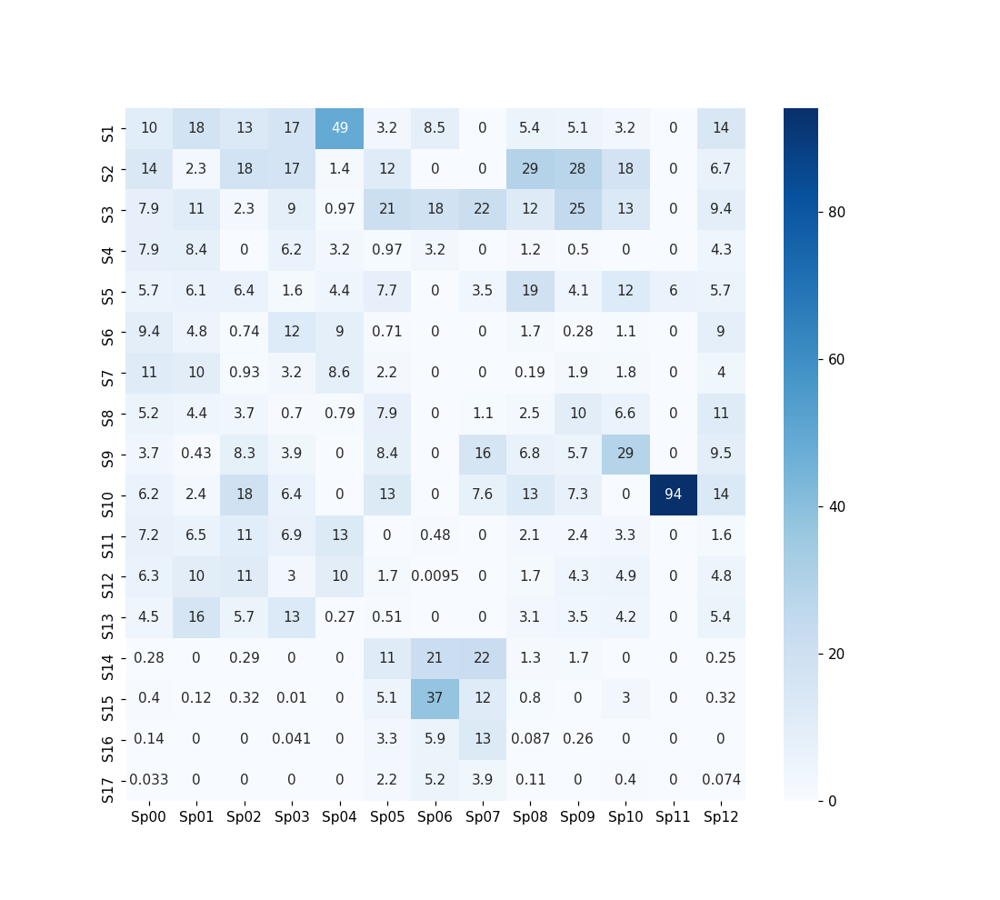

<AxesSubplot:>

In [218]:
df_relative = pd.DataFrame(
    relative_areas, index = sites,
    columns = ['Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(10, 9))
sn.heatmap(df_relative, annot=True, cmap='Blues')

The following plot represents the distribution of the species of a given mosaic (all lines should sum up to 100%). The difference here is that we want to understand for each mosaic how the species are distributed. The goal here is to see which mosaics are composed of the smaller classes and thus might have a lower accuracy because of it. These two plots are complementary.
Keep in mind that seaborn (the python package used for the heatmaps) might exclude small decimal values and trying to sum rows or columns might give numbers under 100%.

<IPython.core.display.Javascript object>


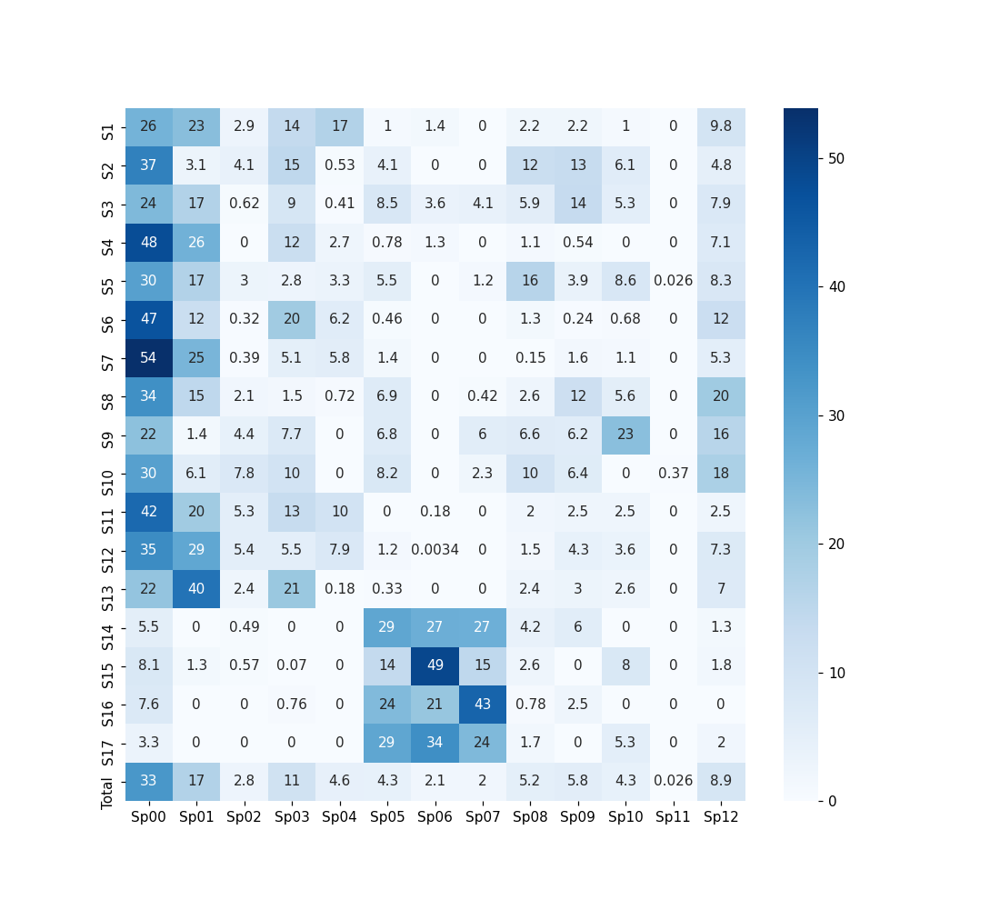

<AxesSubplot:>

In [217]:
df_mosaic = pd.DataFrame(
    mosaic_areas, index = sites  + ['Total'],
    columns = ['Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(10, 9))
sn.heatmap(df_mosaic, annot=True, cmap='Blues')

### Accuracy

Here we analyse the accuracy of all the mosaics. We have two different experiments we want to analyse:
* Training with all the sites together (mixed). These are the results on the left.
* Training only with Sarah's or Luca's sites and testing with the remaining ones (site). These are the results on the right.
Since we realised that the problems are different for Sarah's and Luca's sites, we decided not to test with each others. So, when we train with Sarah's sites, we only test with Sarah's sites, for example.

In [219]:
precision_matrix_mixed = np.zeros((len(sites), len(all_labels)))
recall_matrix_mixed = np.zeros((len(sites), len(all_labels)))
precision_matrix_site = np.zeros((len(sites), len(all_labels)))
recall_matrix_site = np.zeros((len(sites), len(all_labels)))
sarah_path = './class12_Sarah'
luca_path = './class12_Luca'
for i in range(1, len(sites) + 1):
    site_path = sarah_path if i < 14 else luca_path
    gt = cv2.imread(os.path.join(path, 'S{:d}GT.png'.format(i)), cv2.IMREAD_GRAYSCALE)
    pred_mixed = cv2.imread(os.path.join(path, 'S{:d}Result.png'.format(i)), cv2.IMREAD_GRAYSCALE)
    pred_site = cv2.imread(os.path.join(site_path, 'S{:d}Result.png'.format(i)), cv2.IMREAD_GRAYSCALE)
    roi = cv2.imread(os.path.join(path, 'S{:d}ROI.png'.format(i)), cv2.IMREAD_GRAYSCALE) < 100

    gt_vec = gt[roi]
    pred_mixed_vec = pred_mixed[roi]
    pred_site_vec = pred_site[roi]
    
    recalls_mixed = recall(pred_mixed_vec, gt_vec)
    precisions_mixed = precision(pred_mixed_vec, gt_vec)
    recalls_site = recall(pred_site_vec, gt_vec)
    precisions_site = precision(pred_site_vec, gt_vec)

    for (lab, rmixed_i), (_, pmixed_i), (_, rsite_i), (_, psite_i) in zip(
        recalls_mixed, precisions_mixed, recalls_site, precisions_site
    ):
        precision_matrix_mixed[i - 1][lab] = pmixed_i
        recall_matrix_mixed[i - 1][lab] = rmixed_i
        precision_matrix_site[i - 1][lab] = rsite_i
        recall_matrix_site[i - 1][lab] = psite_i
        
    print(
        'S{:d} Accuracy'.format(i), accuracy(pred_mixed_vec, gt_vec),
        '/', accuracy(pred_site_vec, gt_vec)
    )

S1 Accuracy 55.232860080122435 / 59.27815449594488
S2 Accuracy 54.74898648406983 / 49.70123819925957
S3 Accuracy 47.570319803454304 / 42.74729896538898
S4 Accuracy 73.24152233642866 / 75.01802077679622
S5 Accuracy 47.59810225858918 / 58.065861627317624
S6 Accuracy 73.21634332172923 / 71.91471340852206
S7 Accuracy 75.62904601023405 / 80.14550534305464
S8 Accuracy 44.50723147157295 / 45.13278980768966
S9 Accuracy 36.19502441707802 / 36.659241274924064
S10 Accuracy 44.617469912092204 / 40.079214822256034
S11 Accuracy 69.90749718044772 / 70.23689126598396
S12 Accuracy 70.2263215402189 / 70.06777018461639
S13 Accuracy 75.47147190543667 / 82.1814716244442
S14 Accuracy 71.35922390143023 / 55.94261284007948
S15 Accuracy 52.554969694303765 / 45.50570053731739
S16 Accuracy 52.97272219242904 / 65.56088808138348
S17 Accuracy 71.74266974819622 / 68.89767716330276


### Precision and recall

Once again we show the results for all the sites when the training was mixed or specific to a group of sites. The following two plots are the precision matrices for these two trainings. For each matrix, a specific cell represents the precision when compared to the prediction (0-100%) for a species in a mosaic. Precision measures the percentage of accurate predictions for a class (true positive / predicted).

These two plots group all the sites together, even though we could split them. The first one illustrates the results with the mixed training and the second one when the sites were split for training.

<IPython.core.display.Javascript object>


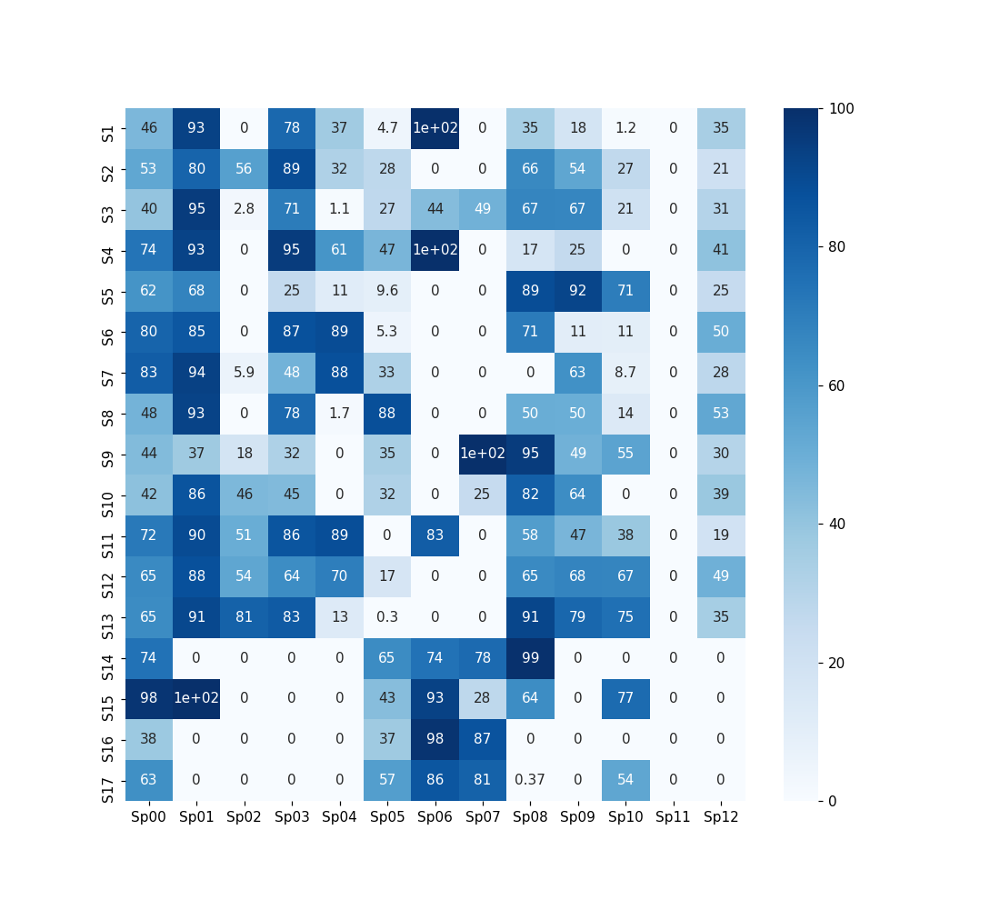

<IPython.core.display.Javascript object>


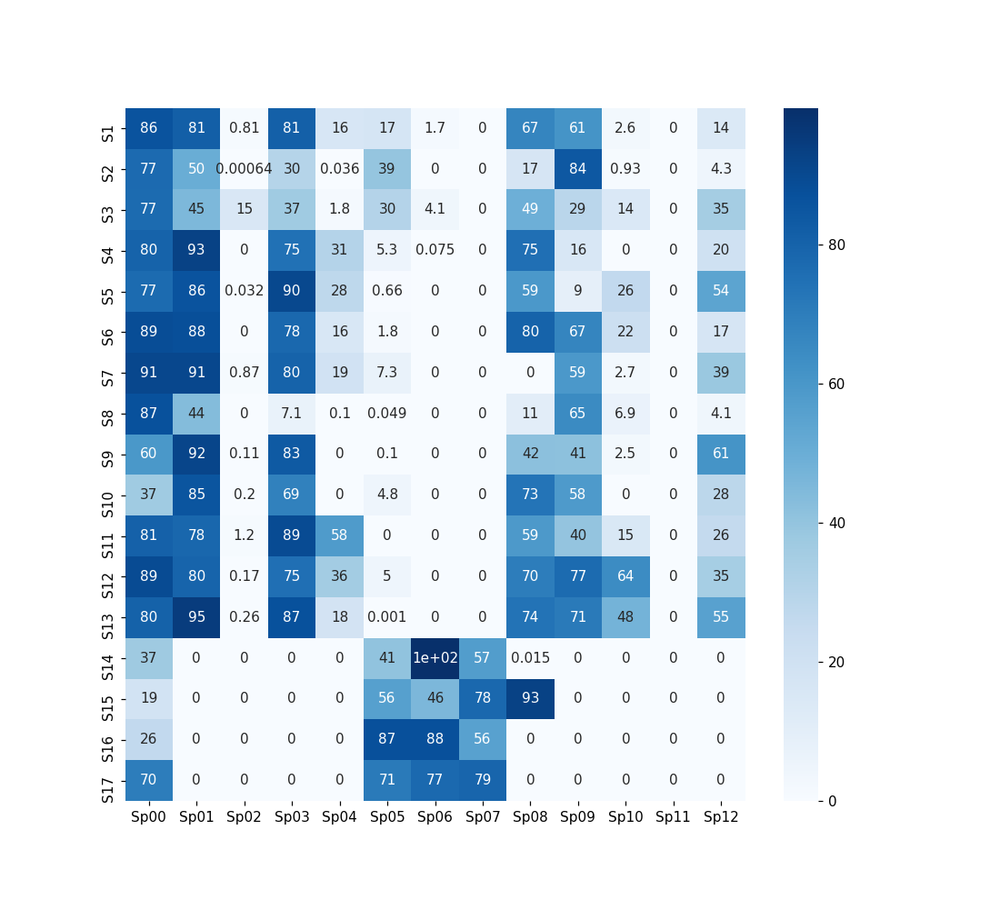

<AxesSubplot:>

In [220]:
df_precision = pd.DataFrame(
    precision_matrix_mixed, index = sites,
    columns = ['Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(10, 9))
sn.heatmap(df_precision, annot=True, cmap='Blues')

df_precision = pd.DataFrame(
    precision_matrix_site, index = sites,
    columns = ['Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(10, 9))
sn.heatmap(df_precision, annot=True, cmap='Blues')

The following two plots are the recall (or true positive rate/fraction) matrices for these two trainings. For each matrix, a specific cell represents the recall (0-100%) for a species in a mosaic. Recall measures the percentage of accurate predictions for a class when compared to the ground truth (true positive / predicted).

These two plots group all the sites together, even though we could split them. The first one illustrates the results with the mixed training and the second one when the sites were split for training.

<IPython.core.display.Javascript object>


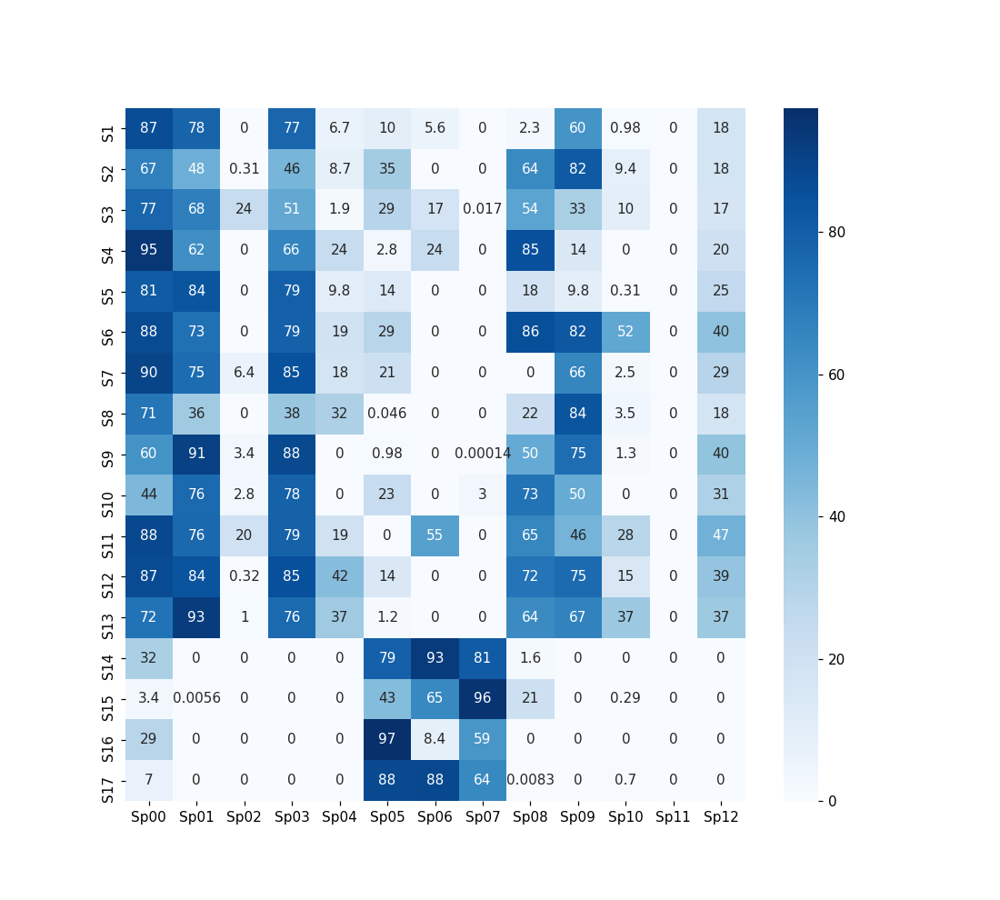

<IPython.core.display.Javascript object>


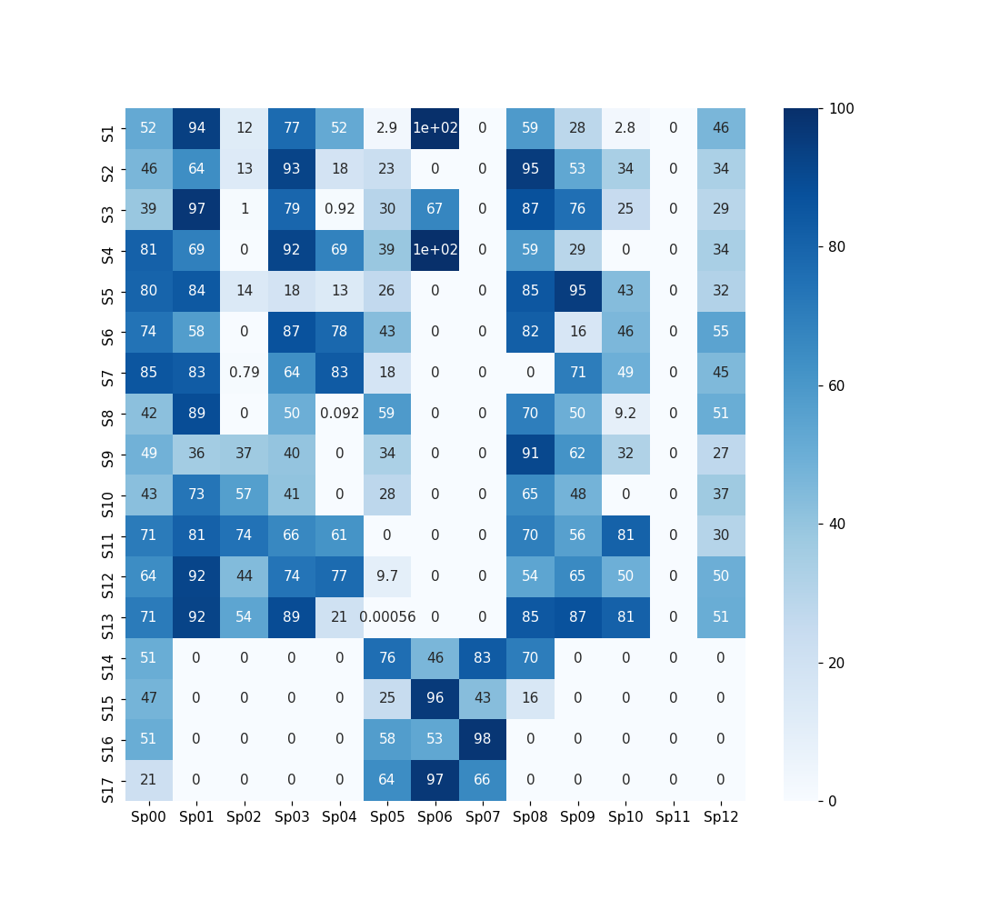

<AxesSubplot:>

In [221]:
df_recall = pd.DataFrame(
    recall_matrix_mixed, index = sites,
    columns = ['Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(10, 9))
sn.heatmap(df_recall, annot=True, cmap='Blues')


df_recall = pd.DataFrame(
    recall_matrix_site, index = sites,
    columns = ['Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(10, 9))
sn.heatmap(df_recall, annot=True, cmap='Blues')

#### Sarah's sites

Specific precision and recall plots for Sarah's sites. The first two plots illustrate the precision matrices for the mixed and specific training, while the last two illustrate the recall matrices for the same two trainings.

<IPython.core.display.Javascript object>


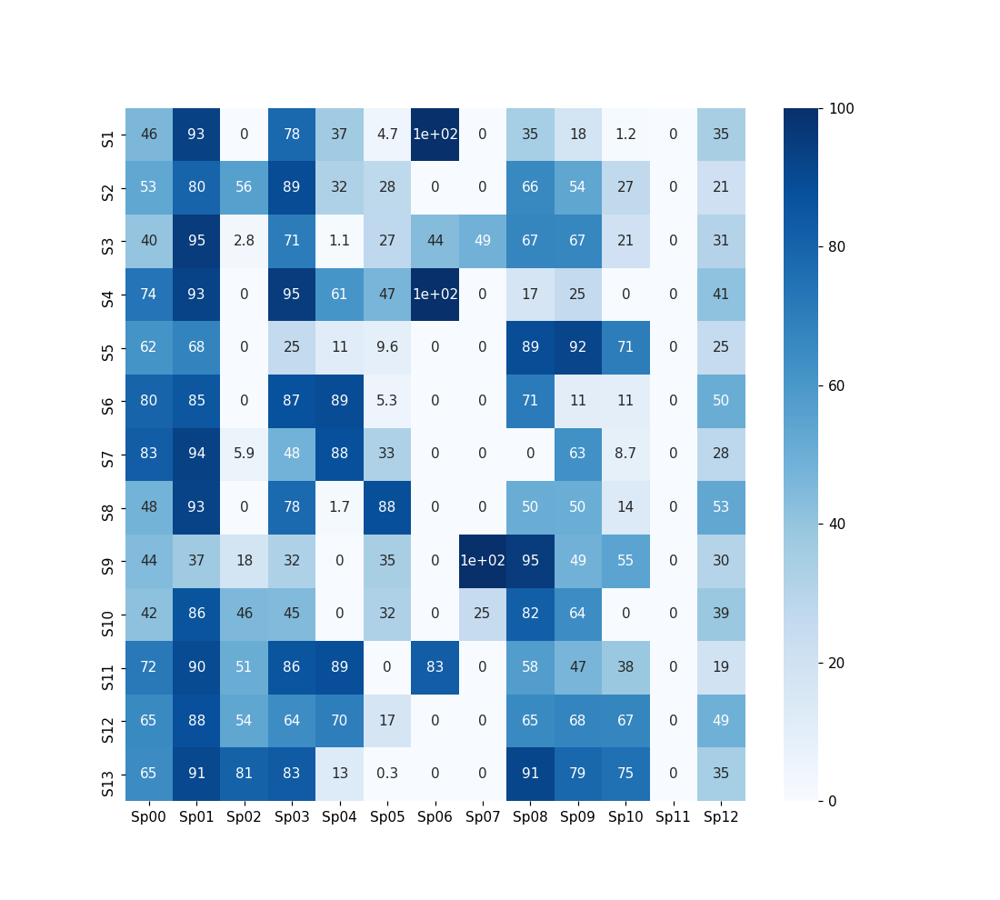

<IPython.core.display.Javascript object>


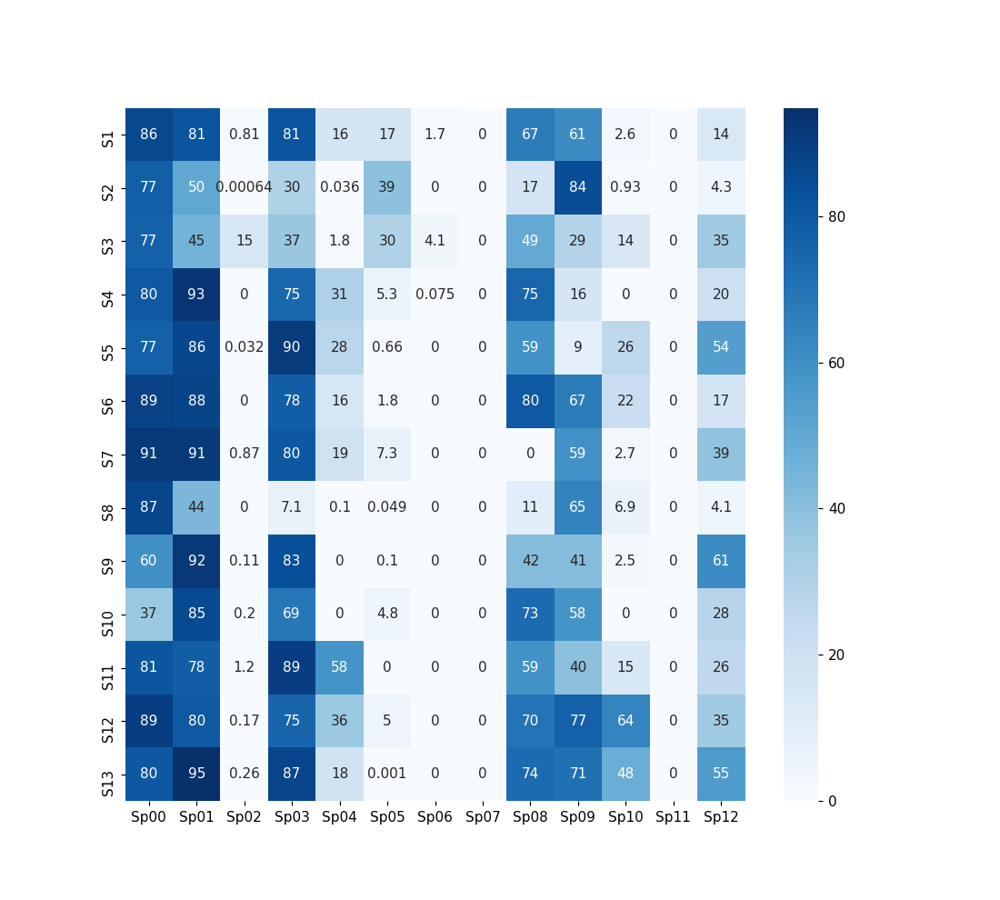

<IPython.core.display.Javascript object>


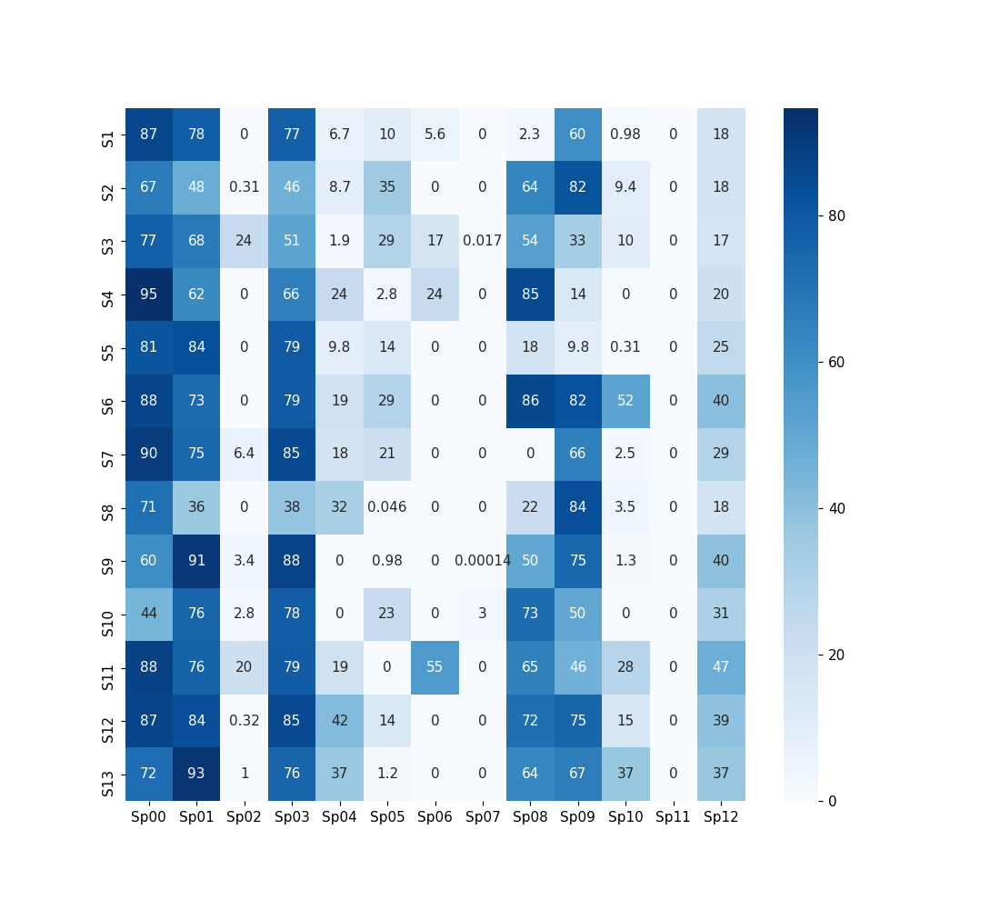

<IPython.core.display.Javascript object>


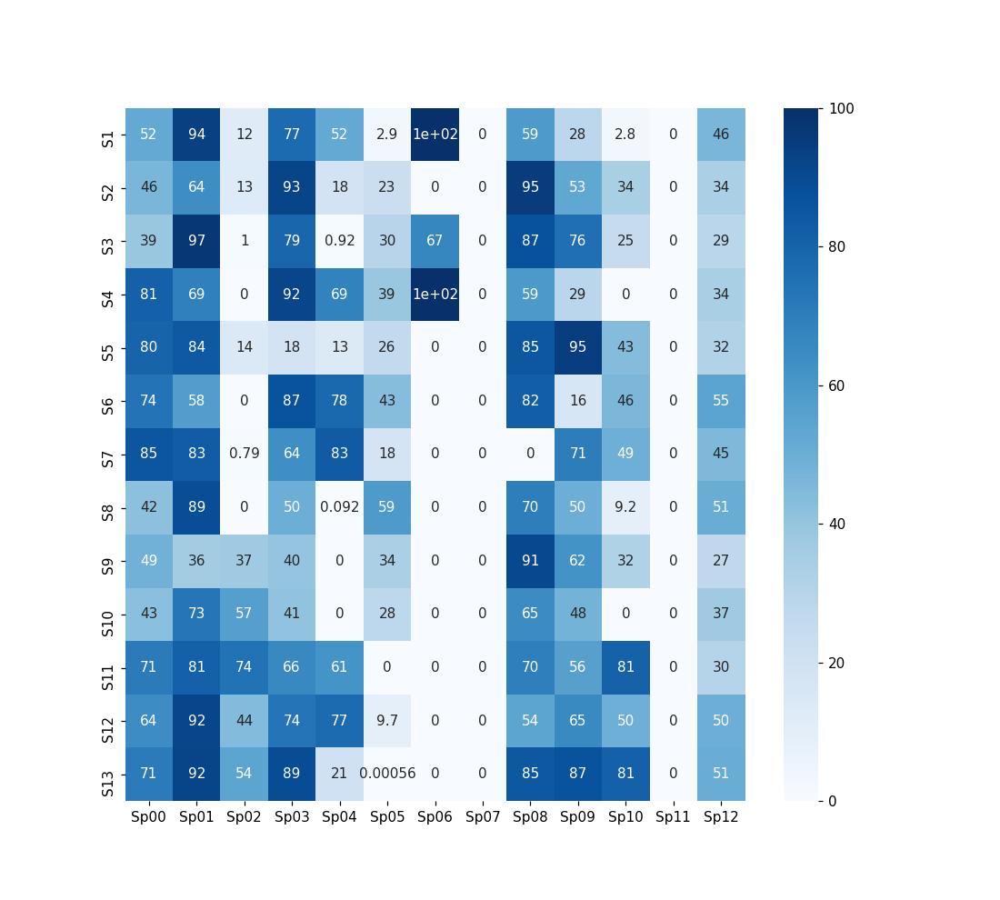

<AxesSubplot:>

In [224]:
df_precision = pd.DataFrame(
    precision_matrix_mixed[:13, :], index = sites[:13],
    columns = ['Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(10, 9))
sn.heatmap(df_precision, annot=True, cmap='Blues')

df_precision = pd.DataFrame(
    precision_matrix_site[:13, :], index = sites[:13],
    columns = ['Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(10, 9))
sn.heatmap(df_precision, annot=True, cmap='Blues')

df_recall = pd.DataFrame(
    recall_matrix_mixed[:13, :], index = sites[:13],
    columns = ['Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(10, 9))
sn.heatmap(df_recall, annot=True, cmap='Blues')

df_recall = pd.DataFrame(
    recall_matrix_site[:13, :], index = sites[:13],
    columns = ['Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(10, 9))
sn.heatmap(df_recall, annot=True, cmap='Blues')

#### Luca's sites

Specific precision and recall plots for Luca's sites. The first two plots illustrate the precision matrices for the mixed and specific training, while the last two illustrate the recall matrices for the same two trainings.

<IPython.core.display.Javascript object>


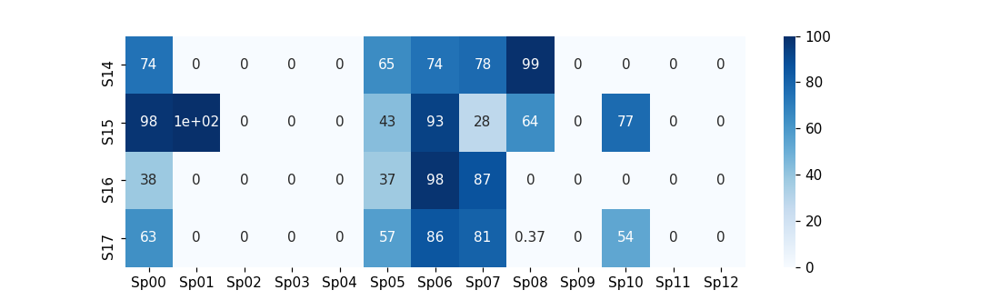

<IPython.core.display.Javascript object>


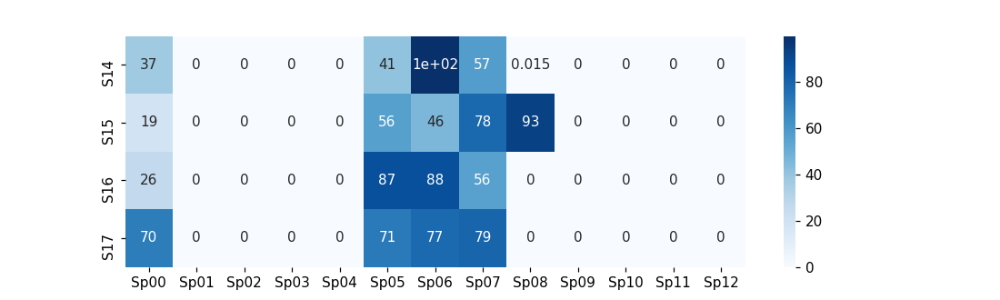

<IPython.core.display.Javascript object>


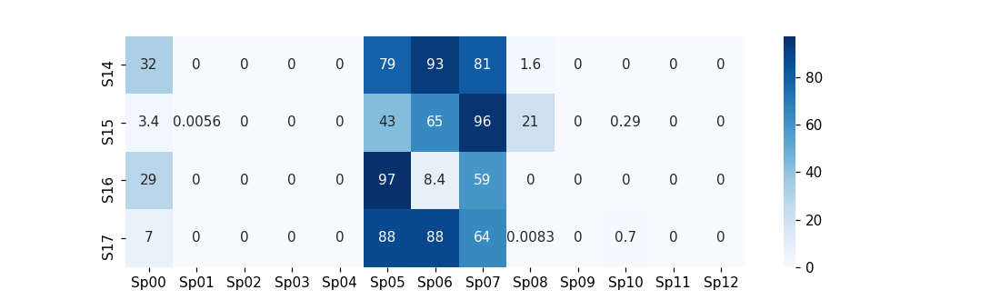

<IPython.core.display.Javascript object>


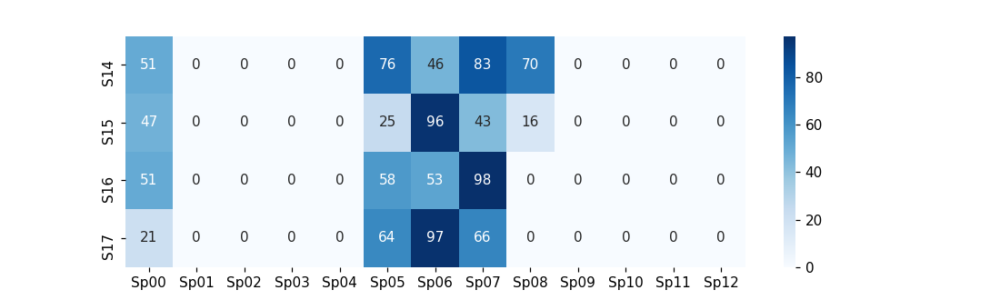

<AxesSubplot:>

In [230]:
df_precision = pd.DataFrame(
    precision_matrix_mixed[13:, :], index = sites[13:],
    columns = ['Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(10, 3))
sn.heatmap(df_precision, annot=True, cmap='Blues')

df_precision = pd.DataFrame(
    precision_matrix_site[13:, :], index = sites[13:],
    columns = ['Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(10, 3))
sn.heatmap(df_precision, annot=True, cmap='Blues')

df_recall = pd.DataFrame(
    recall_matrix_mixed[13:, :], index = sites[13:],
    columns = ['Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(10, 3))
sn.heatmap(df_recall, annot=True, cmap='Blues')

df_recall = pd.DataFrame(
    recall_matrix_site[13:, :], index = sites[13:],
    columns = ['Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(10, 3))
sn.heatmap(df_recall, annot=True, cmap='Blues')

### Confusion matrices

Finally, we finish the analysis with confusion matrices for all the sites. First we will create the confusion matrices per site for both training experiments and then we will group the sites and provide both the overall matrices and specific ones.

In [233]:
cm_mixed_site = [np.zeros((len(all_labels), len(all_labels))) for i in range(1, len(sites) + 1)]
cm_site = [np.zeros((len(all_labels), len(all_labels))) for i in range(1, len(sites) + 1)]

sarah_path = './class12_Sarah'
luca_path = './class12_Luca'
for i in range(1, len(sites) + 1):
    site_path = sarah_path if i < 14 else luca_path
    gt = cv2.imread(os.path.join(path, 'S{:d}GT.png'.format(i)), cv2.IMREAD_GRAYSCALE)
    pred_mixed = cv2.imread(os.path.join(path, 'S{:d}Result.png'.format(i)), cv2.IMREAD_GRAYSCALE)
    pred_site = cv2.imread(os.path.join(site_path, 'S{:d}Result.png'.format(i)), cv2.IMREAD_GRAYSCALE)
    roi = cv2.imread(os.path.join(path, 'S{:d}ROI.png'.format(i)), cv2.IMREAD_GRAYSCALE) < 100

    gt_vec = gt[roi]
    pred_mixed_vec = pred_mixed[roi]
    pred_site_vec = pred_site[roi]
       
    print(
        'S{:02d}'.format(i), np.unique(gt_vec), np.unique(pred_mixed_vec),
        np.unique(pred_site_vec), confusion_matrix.shape
    )
    
    for lab_gt, lab_pred in zip(gt_vec, pred_mixed_vec):
        cm_mixed_site[i - 1][lab_gt, lab_pred] += 1
    for lab_gt, lab_pred in zip(gt_vec, pred_site_vec):
        cm_site[i - 1][lab_gt, lab_pred] += 1

S01 [ 0  1  2  3  4  5  6  8  9 10 12] [ 0  1  2  3  4  5  6  8  9 10 12] [ 0  1  2  3  4  5  6  8  9 10 12] (12, 12)
S02 [ 0  1  2  3  4  5  8  9 10 12] [ 0  1  2  3  4  5  6  7  8  9 10 11 12] [ 0  1  2  3  4  5  6  7  8  9 10 11 12] (12, 12)
S03 [ 0  1  2  3  4  5  6  7  8  9 10 12] [ 0  1  2  3  4  5  6  7  8  9 10 11 12] [ 0  1  2  3  4  5  6  7  8  9 10 12] (12, 12)
S04 [ 0  1  3  4  5  6  8  9 12] [ 0  1  2  3  4  5  6  7  8  9 10 12] [ 0  1  2  3  4  5  6  8  9 10 12] (12, 12)
S05 [ 0  1  2  3  4  5  7  8  9 10 11 12] [ 0  1  3  4  5  6  7  8  9 10 12] [ 0  1  2  3  4  5  6  8  9 10 12] (12, 12)
S06 [ 0  1  2  3  4  5  8  9 10 12] [ 0  1  2  3  4  5  6  7  8  9 10 12] [ 0  1  2  3  4  5  6  7  8  9 10 11 12] (12, 12)
S07 [ 0  1  2  3  4  5  8  9 10 12] [ 0  1  2  3  4  5  8  9 10 12] [ 0  1  2  3  4  5  6  8  9 10 12] (12, 12)
S08 [ 0  1  2  3  4  5  7  8  9 10 12] [ 0  1  3  4  5  8  9 10 12] [ 0  1  2  3  4  5  6  8  9 10 12] (12, 12)
S09 [ 0  1  2  3  5  7  8  9 10 12] [ 0  

First we plot the overall confusion matrices. The first one represents the results when using a mixed the training and the second one the grouped training.

<IPython.core.display.Javascript object>


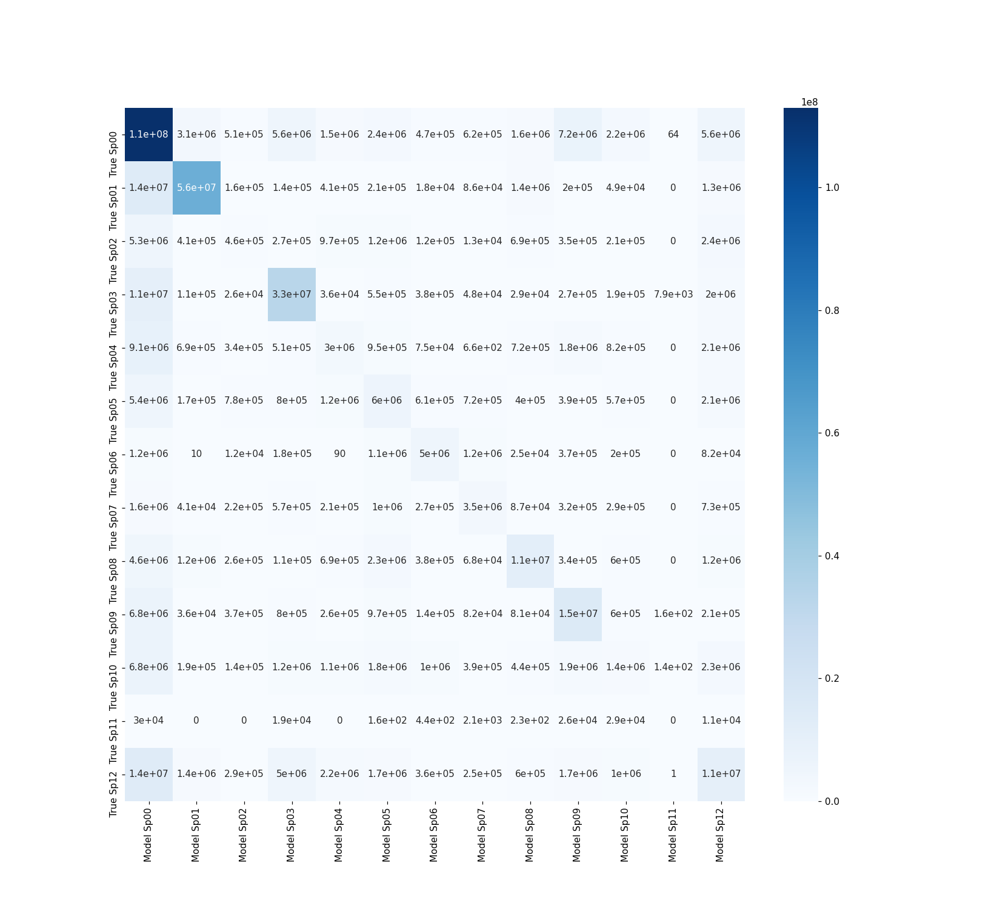

<IPython.core.display.Javascript object>


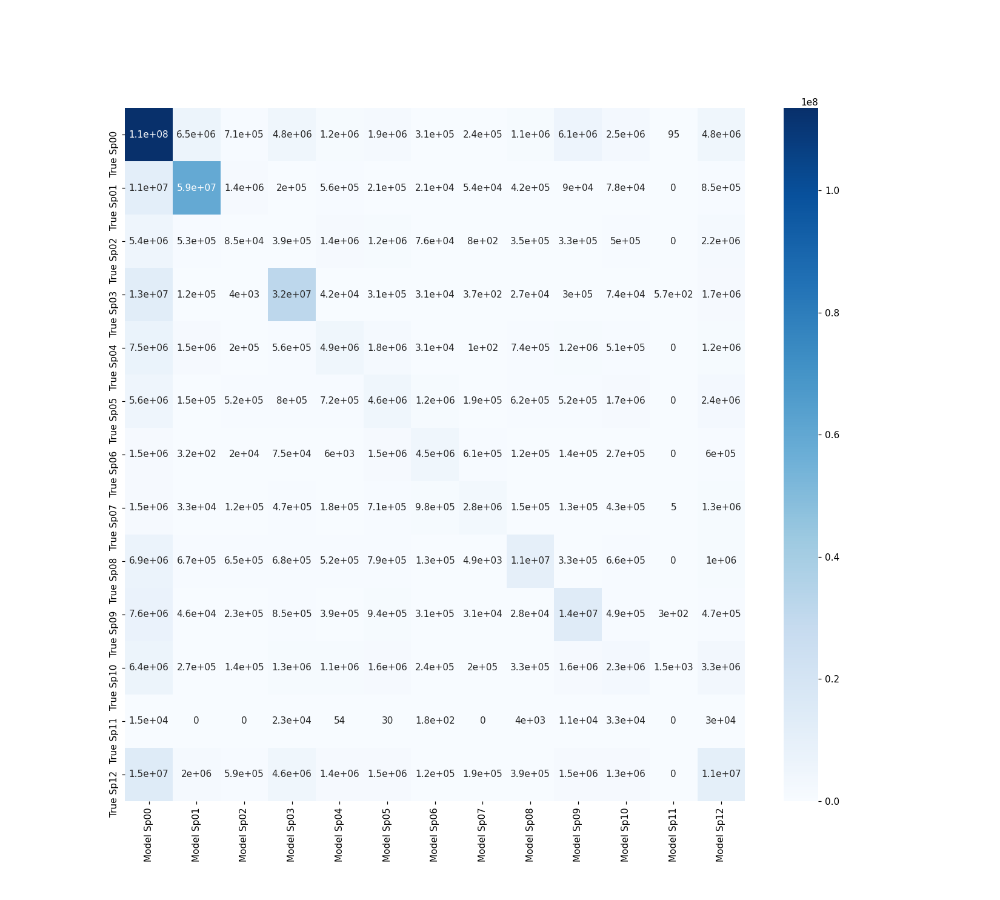

<AxesSubplot:>

In [236]:
cm_mixed_all = np.zeros((len(all_labels), len(all_labels)))
cm_all = np.zeros((len(all_labels), len(all_labels)))
for cm_mixed_i, cm_i in zip(cm_mixed_site, cm_site):
    cm_mixed_all += cm_mixed_i
    cm_all += cm_i
    
df_all = pd.DataFrame(
    cm_mixed_all, index=['True Sp{:02d}'.format(k) for k in all_labels],
    columns=['Model Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(15, 13.5))
sn.heatmap(df_all, annot=True, cmap='Blues')

df_all = pd.DataFrame(
    cm_all, index=['True Sp{:02d}'.format(k) for k in all_labels],
    columns=['Model Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(15, 13.5))
sn.heatmap(df_all, annot=True, cmap='Blues')

For better readability, on the following matrix we divided the values by the total sum of pixels on the ground truth for that class. That means that now all the values in a line should sum up to 100%. This is not the conventional way to show confusion matrices, but it helps to better understand where the false negatives are located. Furthermore, it also helps to make the heat colours more relevant. Some classes have different orders of magnitude in terms of pixels and that obscures the actual performance for the small ones if we use absolute values.

<IPython.core.display.Javascript object>


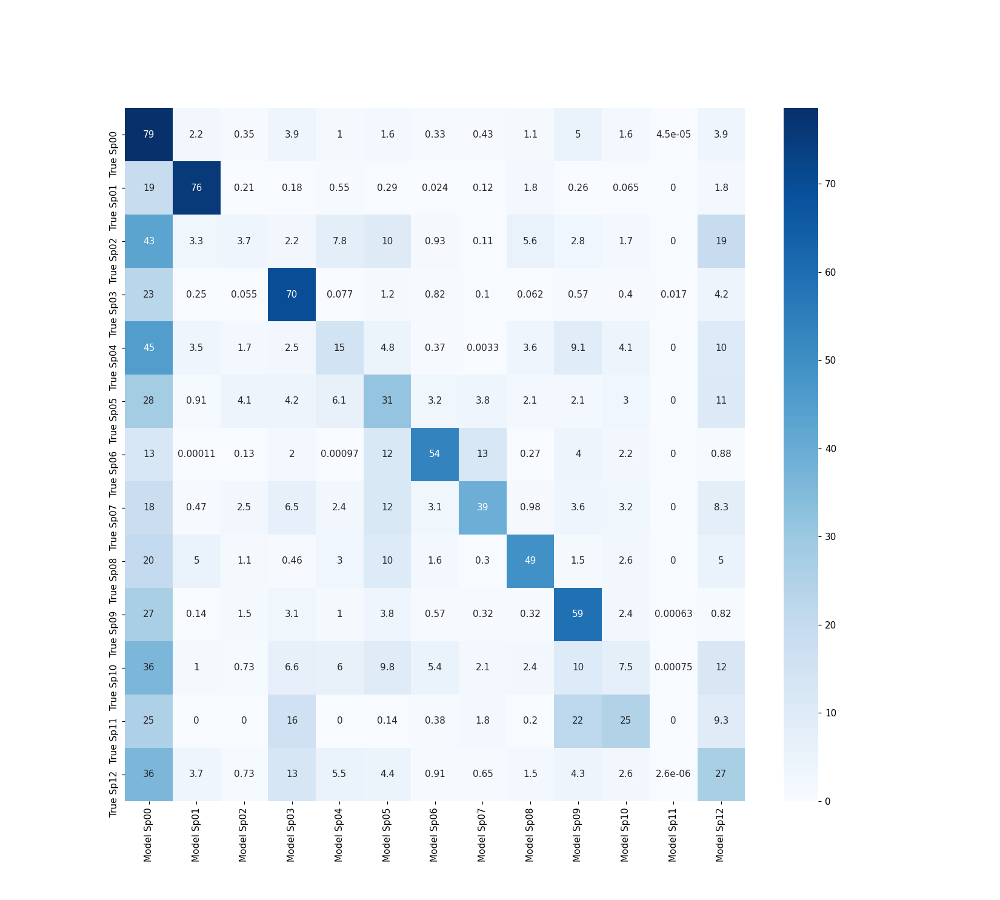

<IPython.core.display.Javascript object>


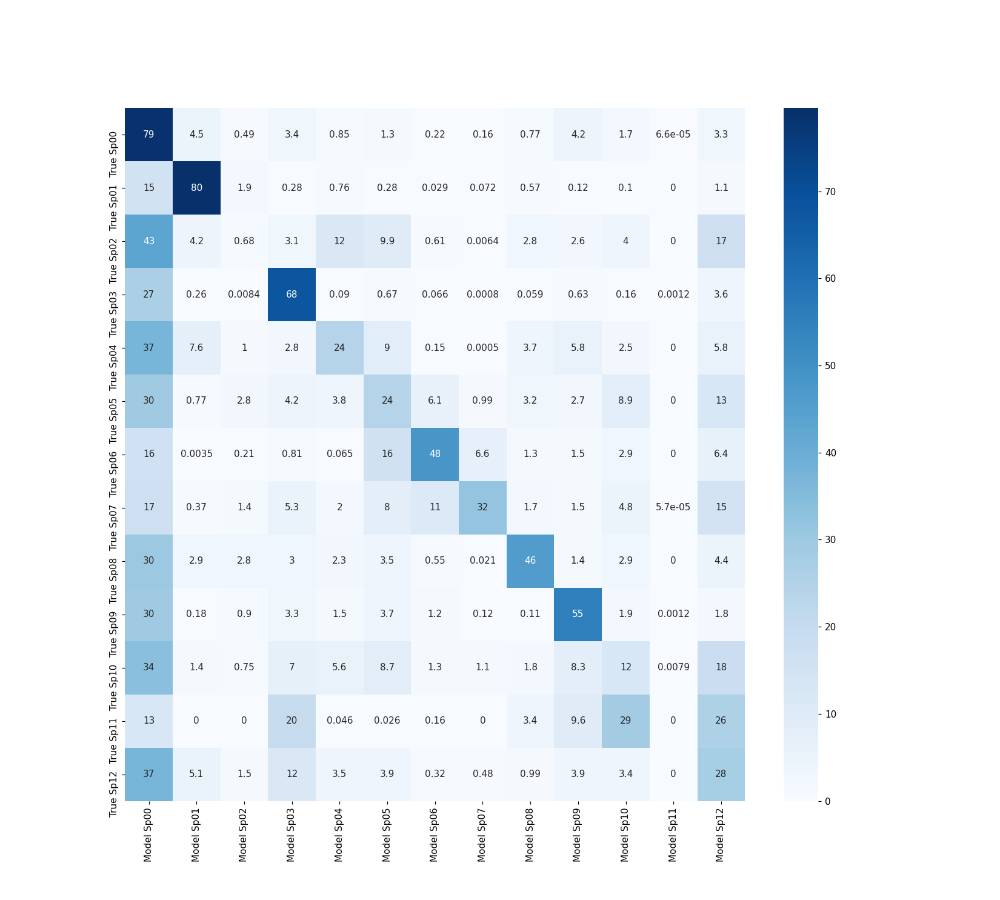

<AxesSubplot:>

In [242]:
cm_mixed_all = np.zeros((len(all_labels), len(all_labels)))
cm_all = np.zeros((len(all_labels), len(all_labels)))
for cm_mixed_i, cm_i in zip(cm_mixed_site, cm_site):
    for lab, area_i in enumerate(areas):
        cm_mixed_all[lab, :] += 100 * cm_mixed_i[lab, :] / area_i
        cm_all[lab, :] += 100 * cm_i[lab, :] / area_i
    
df_all = pd.DataFrame(
    cm_mixed_all, index=['True Sp{:02d}'.format(k) for k in all_labels],
    columns=['Model Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(15, 13.5))
sn.heatmap(df_all, annot=True, cmap='Blues')

df_all = pd.DataFrame(
    cm_all, index=['True Sp{:02d}'.format(k) for k in all_labels],
    columns=['Model Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(15, 13.5))
sn.heatmap(df_all, annot=True, cmap='Blues')

#### Sarah's site

The following cells represent the same type of confusion matrices we used on the previous cells. The main difference here is that we excluded the confusion matrices of Luca's sites.

<IPython.core.display.Javascript object>


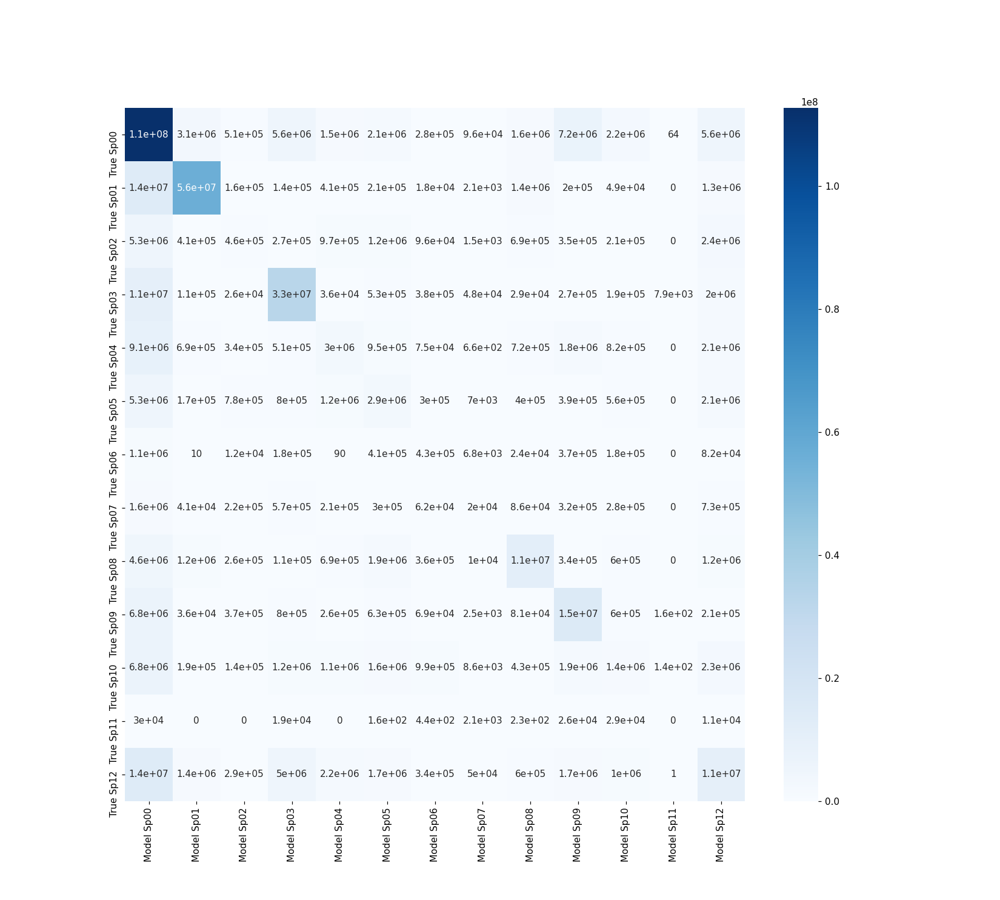

<IPython.core.display.Javascript object>


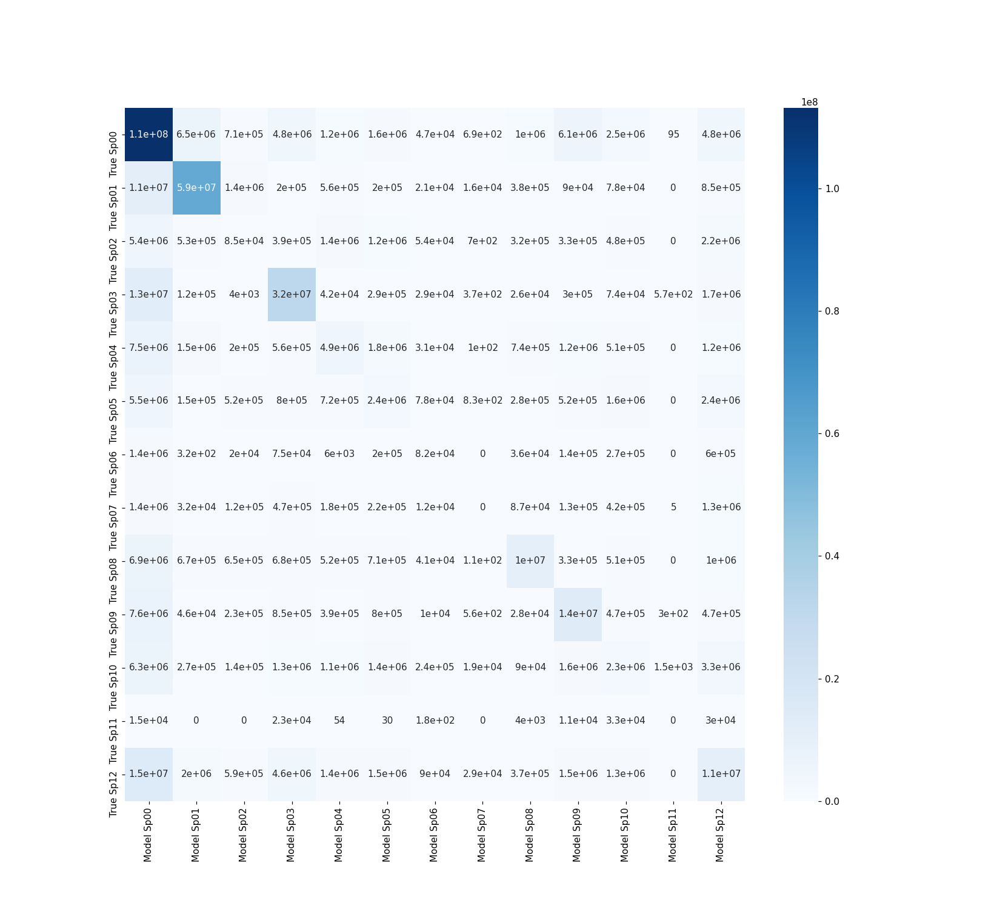

<AxesSubplot:>

In [243]:
cm_mixed_sarah = np.zeros((len(all_labels), len(all_labels)))
cm_sarah = np.zeros((len(all_labels), len(all_labels)))
for cm_mixed_i, cm_i in zip(cm_mixed_site[:13], cm_site[:13]):
    cm_mixed_sarah += cm_mixed_i
    cm_sarah += cm_i
    
df_sarah = pd.DataFrame(
    cm_mixed_sarah, index=['True Sp{:02d}'.format(k) for k in all_labels],
    columns=['Model Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(15, 13.5))
sn.heatmap(df_sarah, annot=True, cmap='Blues')

df_sarah = pd.DataFrame(
    cm_sarah, index=['True Sp{:02d}'.format(k) for k in all_labels],
    columns=['Model Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(15, 13.5))
sn.heatmap(df_sarah, annot=True, cmap='Blues')

<IPython.core.display.Javascript object>


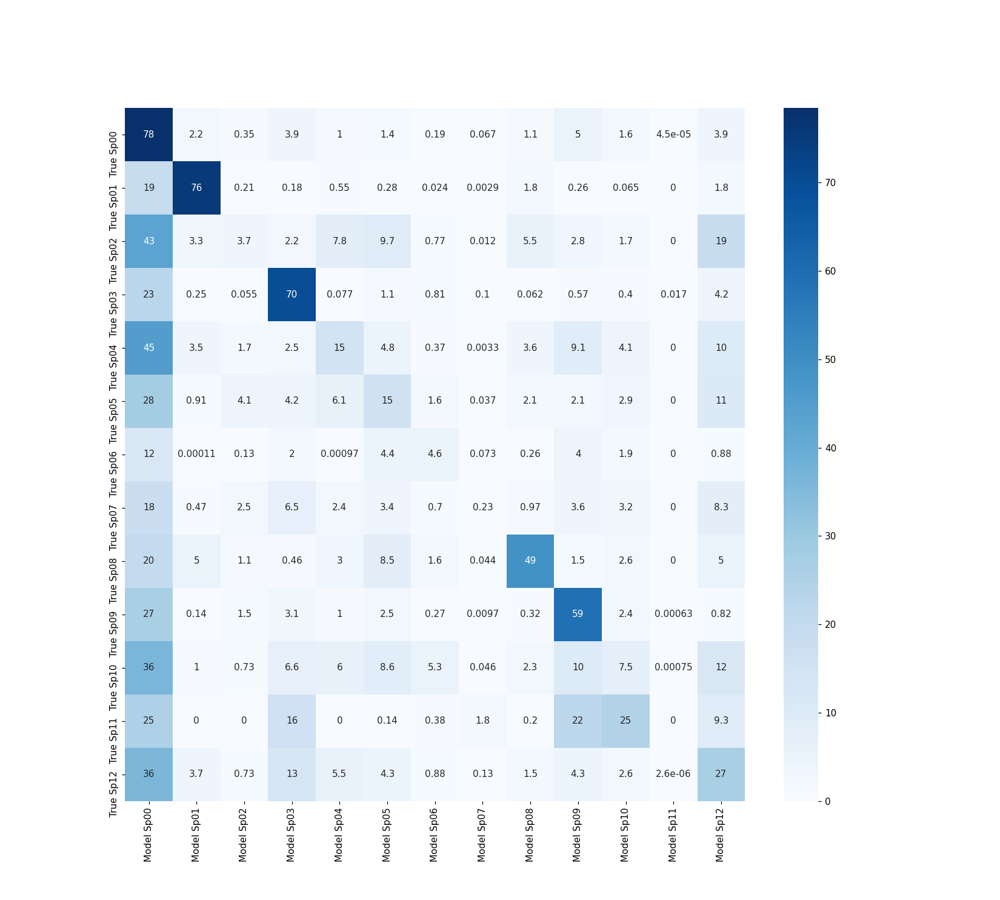

<IPython.core.display.Javascript object>


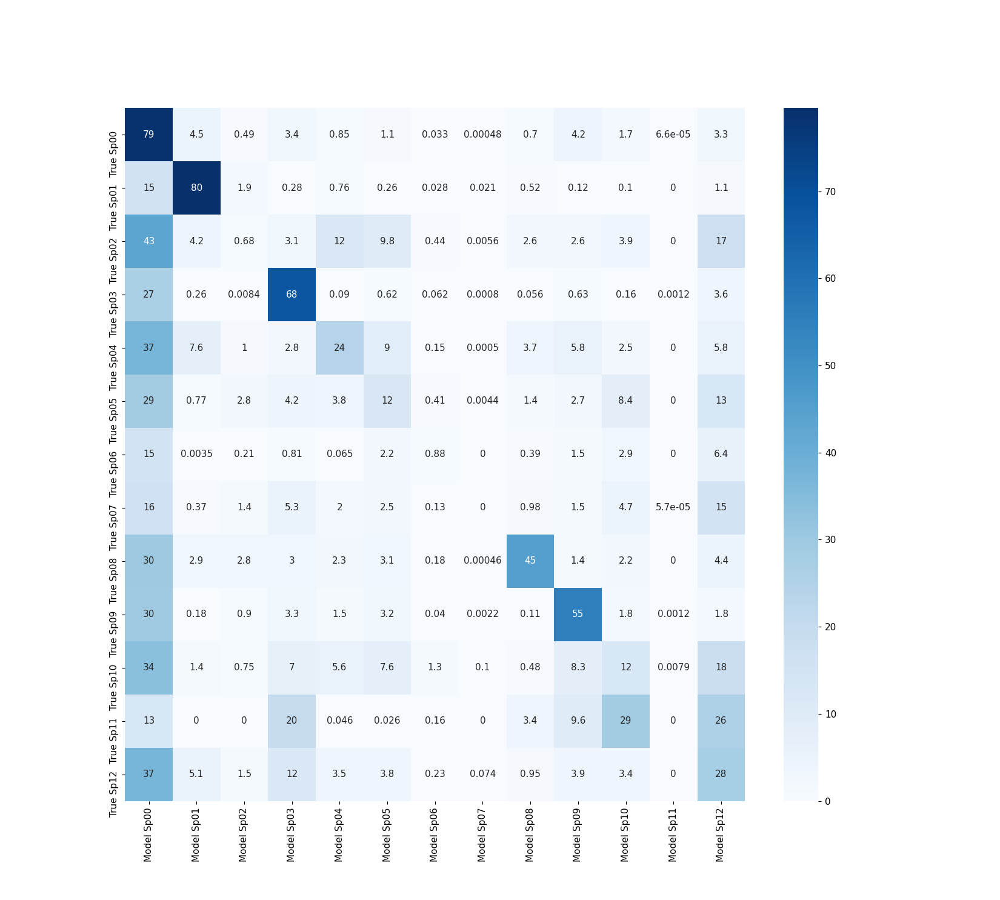

<AxesSubplot:>

In [245]:
cm_mixed_sarah = np.zeros((len(all_labels), len(all_labels)))
cm_sarah = np.zeros((len(all_labels), len(all_labels)))
for cm_mixed_i, cm_i in zip(cm_mixed_site[:13], cm_site[:13]):
    for lab, area_i in enumerate(areas):
        cm_mixed_sarah[lab, :] += 100 * cm_mixed_i[lab, :] / area_i
        cm_sarah[lab, :] += 100 * cm_i[lab, :] / area_i
    
df_sarah = pd.DataFrame(
    cm_mixed_sarah, index=['True Sp{:02d}'.format(k) for k in all_labels],
    columns=['Model Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(15, 13.5))
sn.heatmap(df_sarah, annot=True, cmap='Blues')

df_sarah = pd.DataFrame(
    cm_sarah, index=['True Sp{:02d}'.format(k) for k in all_labels],
    columns=['Model Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(15, 13.5))
sn.heatmap(df_sarah, annot=True, cmap='Blues')

#### Luca's site

The following cells represent the same type of confusion matrices we used on the previous cells. The main difference here is that we excluded the confusion matrices of Sarah's sites.

<IPython.core.display.Javascript object>


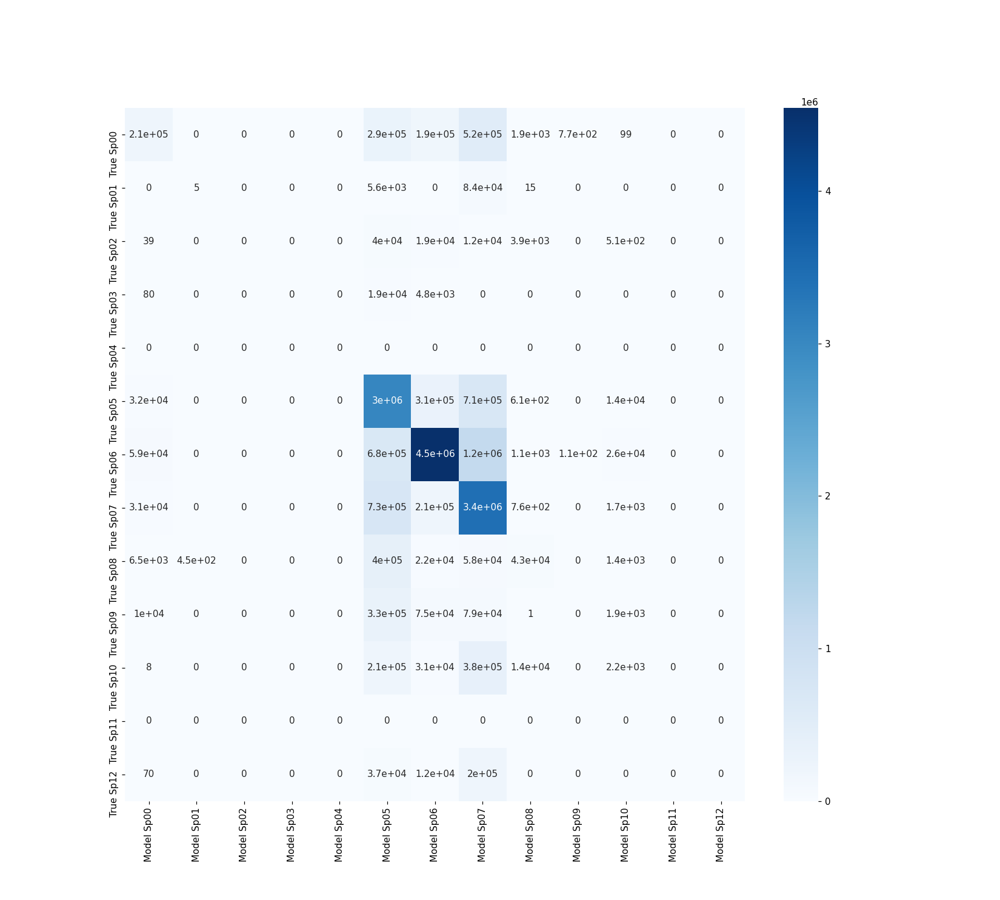

<IPython.core.display.Javascript object>


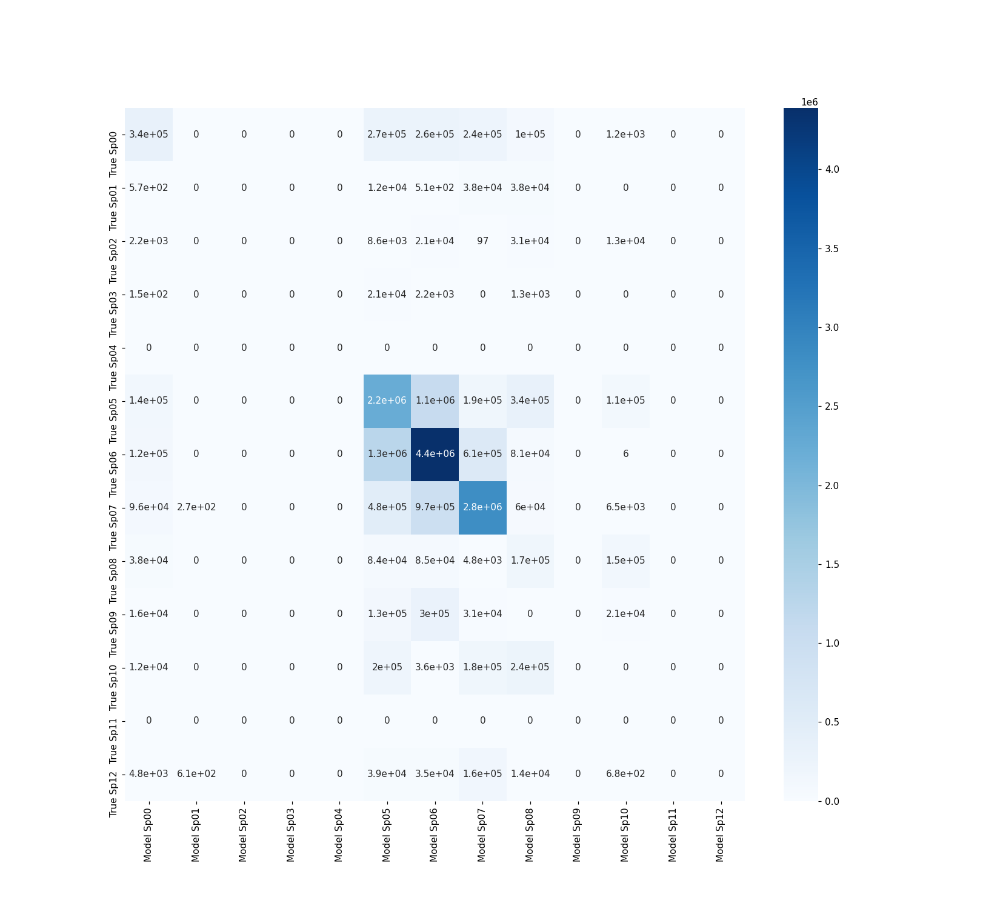

<AxesSubplot:>

In [246]:
cm_mixed_luca = np.zeros((len(all_labels), len(all_labels)))
cm_luca = np.zeros((len(all_labels), len(all_labels)))
for cm_mixed_i, cm_i in zip(cm_mixed_site[13:], cm_site[13:]):
    cm_mixed_luca += cm_mixed_i
    cm_luca += cm_i
    
df_luca = pd.DataFrame(
    cm_mixed_luca, index=['True Sp{:02d}'.format(k) for k in all_labels],
    columns=['Model Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(15, 13.5))
sn.heatmap(df_luca, annot=True, cmap='Blues')

df_luca = pd.DataFrame(
    cm_luca, index=['True Sp{:02d}'.format(k) for k in all_labels],
    columns=['Model Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(15, 13.5))
sn.heatmap(df_luca, annot=True, cmap='Blues')

<IPython.core.display.Javascript object>


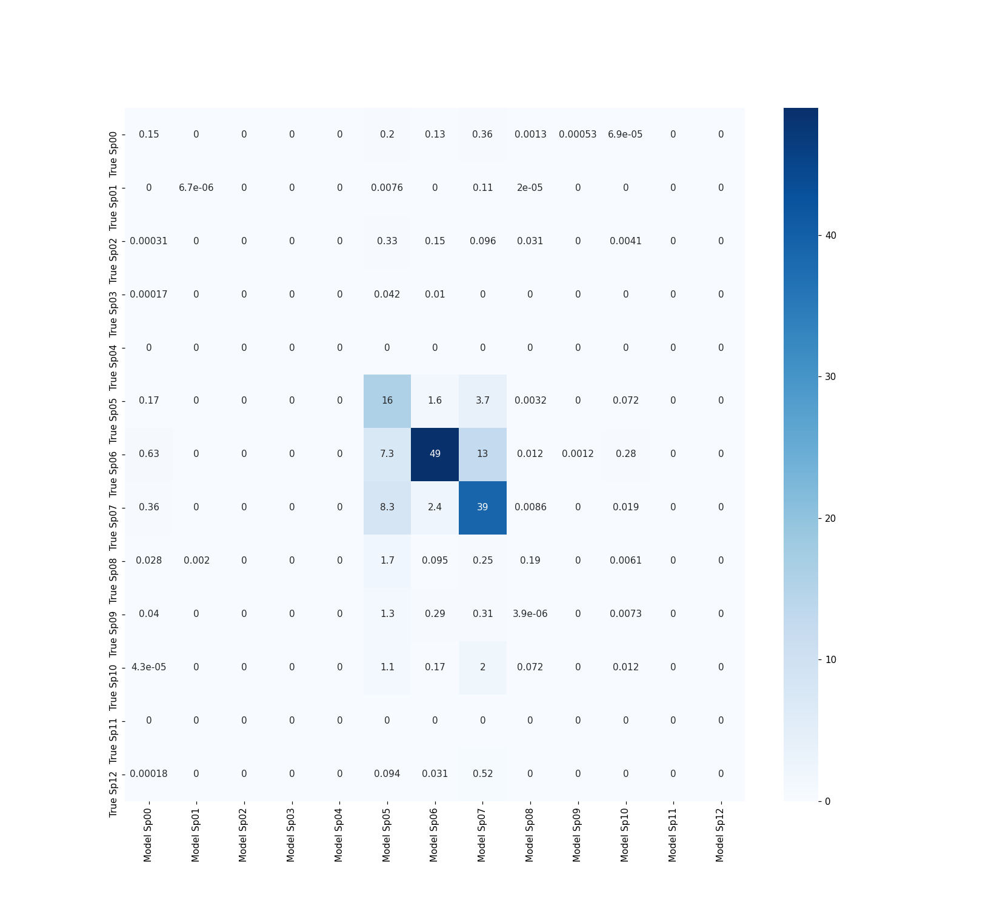

<IPython.core.display.Javascript object>


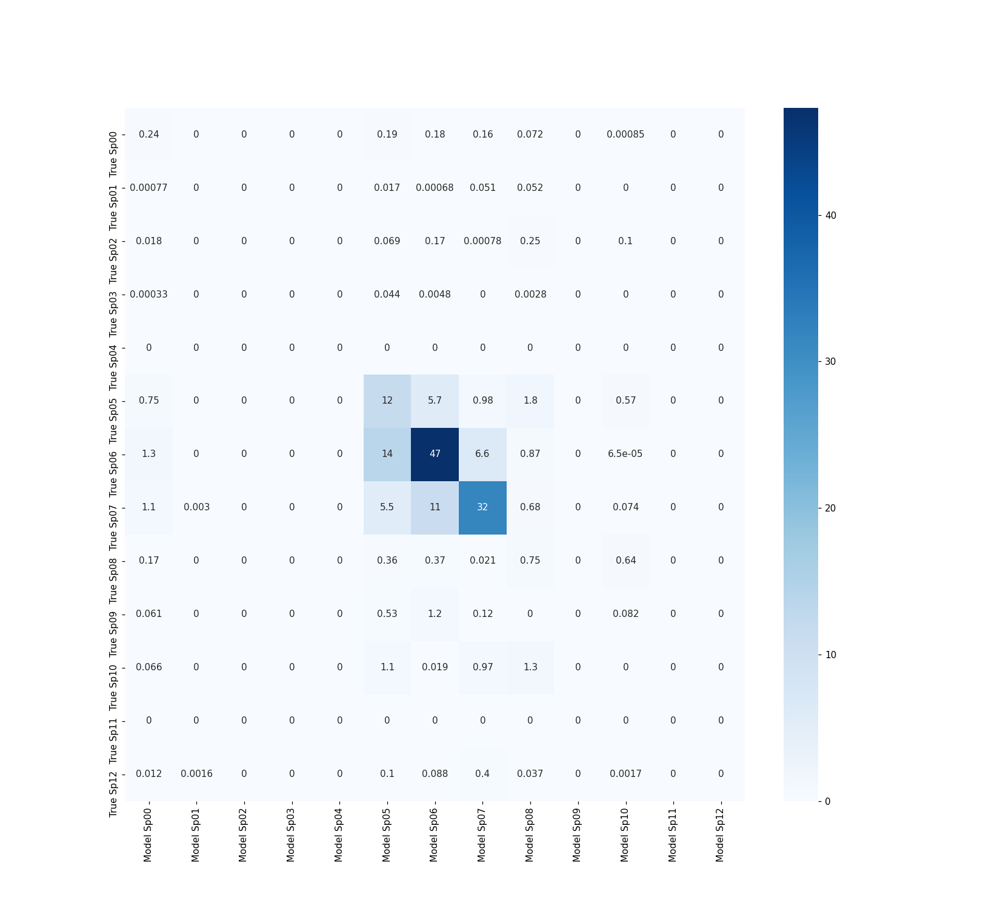

<AxesSubplot:>

In [247]:
cm_mixed_luca = np.zeros((len(all_labels), len(all_labels)))
cm_luca = np.zeros((len(all_labels), len(all_labels)))
for cm_mixed_i, cm_i in zip(cm_mixed_site[13:], cm_site[13:]):
    for lab, area_i in enumerate(areas):
        cm_mixed_luca[lab, :] += 100 * cm_mixed_i[lab, :] / area_i
        cm_luca[lab, :] += 100 * cm_i[lab, :] / area_i
    
df_luca = pd.DataFrame(
    cm_mixed_luca, index=['True Sp{:02d}'.format(k) for k in all_labels],
    columns=['Model Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(15, 13.5))
sn.heatmap(df_luca, annot=True, cmap='Blues')

df_luca = pd.DataFrame(
    cm_luca, index=['True Sp{:02d}'.format(k) for k in all_labels],
    columns=['Model Sp{:02d}'.format(k) for k in all_labels]
)
fig = plt.figure(figsize=(15, 13.5))
sn.heatmap(df_luca, annot=True, cmap='Blues')

### Level 1 segmentation

**Keep in mind that all level 1 results are still a work in progress.** There are sites missing from the following cells and the groups might not be ideal and we might change them down the line. We also still need to go back to the 12-class scenario with a second segmentation step. As such, do not focus too much on the following cells.

The following cells focus on the segmentations of large classes.
We kept the largest classes as level 1 classes (0, 1, 3, 8 and 9) and grouped everything else as "others" (class 5).

In [80]:
path = './level1_all'

l1_sites = ['S{:d}'.format(i) for i in range(1, 16)] + ['S17']
l1_labels = []
for s in l1_sites:
    gt = cv2.imread(os.path.join(path, '{:}GT.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    l1_labels += [lab for lab in np.unique(gt).tolist() if lab not in l1_labels]
    print(s, sorted(l1_labels))
l1_labels = sorted(l1_labels)

S1 [0, 1, 2, 3, 4, 5]
S2 [0, 1, 2, 3, 4, 5]
S3 [0, 1, 2, 3, 4, 5]
S4 [0, 1, 2, 3, 4, 5]
S5 [0, 1, 2, 3, 4, 5]
S6 [0, 1, 2, 3, 4, 5]
S7 [0, 1, 2, 3, 4, 5]
S8 [0, 1, 2, 3, 4, 5]
S9 [0, 1, 2, 3, 4, 5]
S10 [0, 1, 2, 3, 4, 5]
S11 [0, 1, 2, 3, 4, 5]
S12 [0, 1, 2, 3, 4, 5]
S13 [0, 1, 2, 3, 4, 5]
S14 [0, 1, 2, 3, 4, 5]
S15 [0, 1, 2, 3, 4, 5]
S17 [0, 1, 2, 3, 4, 5]


In [82]:
areas_l1 = [0] * len(l1_labels)
for s in l1_sites:
    gt = cv2.imread(os.path.join(path, '{:}GT.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    roi = cv2.imread(os.path.join(path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    gt = gt[roi]
    for lab in l1_labels:
        areas_l1[lab] += np.sum(gt == lab)

for species, rate in zip(np.argsort(areas_l1)[::-1],  np.sort(areas_l1)[::-1]):
    print(species, 100 * rate / np.sum(areas_l1))

0 32.73530393805425
5 28.623671385782103
1 16.938347533050035
2 10.684611463428883
4 5.787651025343659
3 5.230414654341071


In [83]:
relative_areas = np.zeros((len(l1_sites), len(l1_labels)))
for i, s in enumerate(l1_sites):
    gt = cv2.imread(os.path.join(path, '{:}GT.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    roi = cv2.imread(os.path.join(path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    gt = gt[roi]
    for lab in l1_labels:
        relative_areas[i][lab] = 100 * np.sum(gt == lab) / areas_l1[lab]

In [84]:
mosaic_areas = np.zeros((len(l1_sites) + 1, len(l1_labels)))
for i, s in enumerate(l1_sites):
    gt = cv2.imread(os.path.join(path, '{:}GT.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    roi = cv2.imread(os.path.join(path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    gt = gt[roi]
    for lab in l1_labels:
        mosaic_areas[i][lab] = 100 * np.sum(gt == lab) / len(gt)
for lab in l1_labels:
    mosaic_areas[-1][lab] = 100 * areas_l1[lab] / np.sum(areas_l1)

<IPython.core.display.Javascript object>


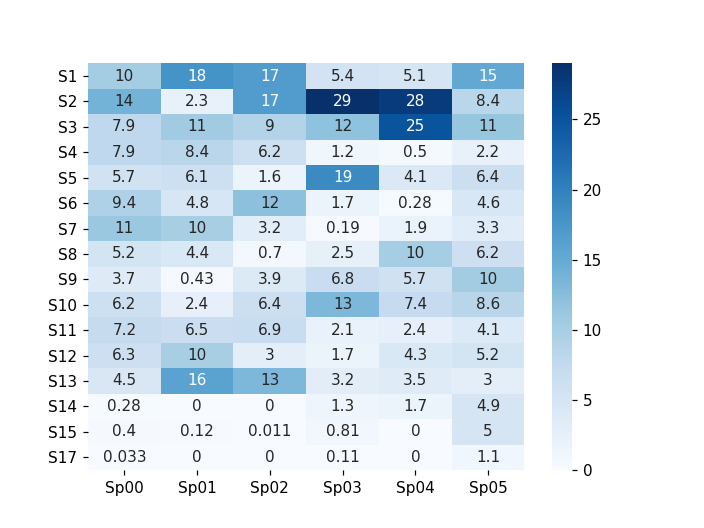

<AxesSubplot:>

In [85]:
df_relative = pd.DataFrame(
    relative_areas, index=l1_sites,
    columns=['Sp{:02d}'.format(k) for k in l1_labels]
)
plt.figure()
sn.heatmap(df_relative, annot=True, cmap='Blues')

<IPython.core.display.Javascript object>


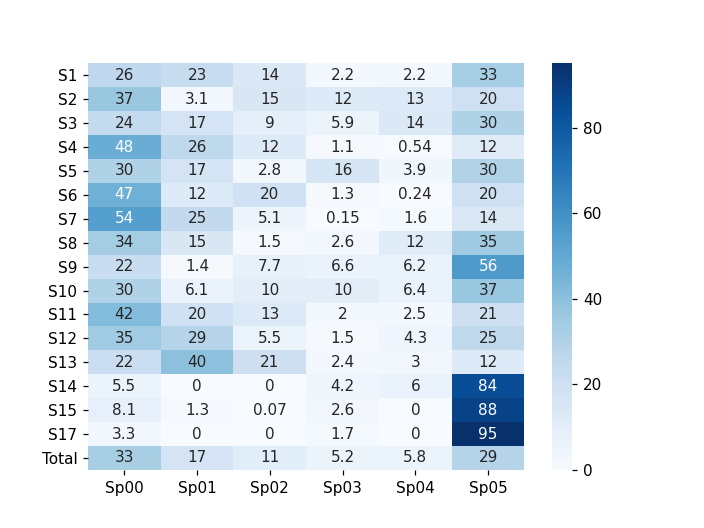

<AxesSubplot:>

In [86]:
df_mosaic = pd.DataFrame(
    mosaic_areas, index=l1_sites  + ['Total'],
    columns = ['Sp{:02d}'.format(k) for k in l1_labels]
)
plt.figure()
sn.heatmap(df_mosaic, annot=True, cmap='Blues')

In [87]:
l1_precision_matrix = np.zeros((len(sites), len(l1_labels)))
l1_recall_matrix = np.zeros((len(sites), len(l1_labels)))
for i, s in enumerate(l1_sites):
    gt = cv2.imread(os.path.join(path, '{:}GT.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    pred = cv2.imread(os.path.join(path, '{:}Result.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    roi = cv2.imread(os.path.join(path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100

    gt_vec = gt[roi]
    pred_vec = pred[roi]
    
    recalls = recall(pred_vec, gt_vec)
    precisions = precision(pred_vec, gt_vec)

    for (lab, recall_i), (_, precision_i) in zip(recalls, precisions):
#         print(
#             'S{:d}'.format(i), 'Class', lab, recall_i, precision_i
#         )
        l1_precision_matrix[i][lab] = precision_i
        l1_recall_matrix[i][lab] = recall_i
        
    print('{:} Accuracy'.format(s), accuracy(pred_vec, gt_vec))

S1 Accuracy 66.26613383751655
S2 Accuracy 54.622116650646056
S3 Accuracy 57.25813179464076
S4 Accuracy 74.5969390233343
S5 Accuracy 58.74560801079287
S6 Accuracy 76.45852978840834
S7 Accuracy 81.50577092606865
S8 Accuracy 56.73614185305644
S9 Accuracy 72.48216519480219
S10 Accuracy 53.82852138211026
S11 Accuracy 76.91130129012106
S12 Accuracy 80.56607427963077
S13 Accuracy 82.16809437600271
S14 Accuracy 84.40335828162326
S15 Accuracy 88.94469021260309
S17 Accuracy 95.10208622930918


<IPython.core.display.Javascript object>


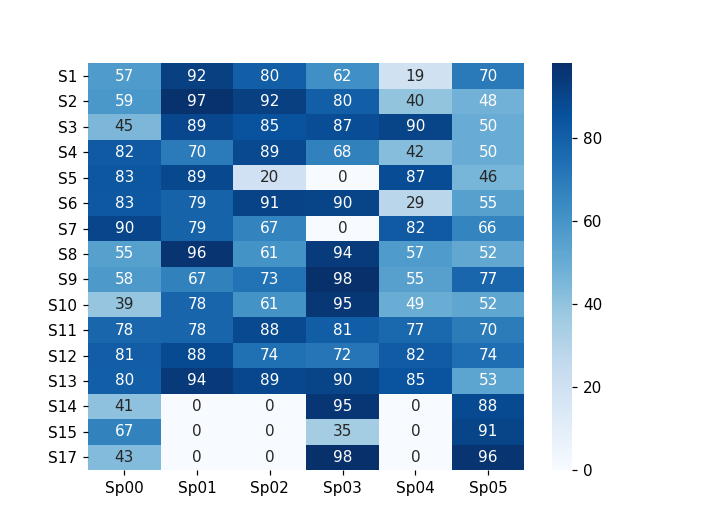

<IPython.core.display.Javascript object>


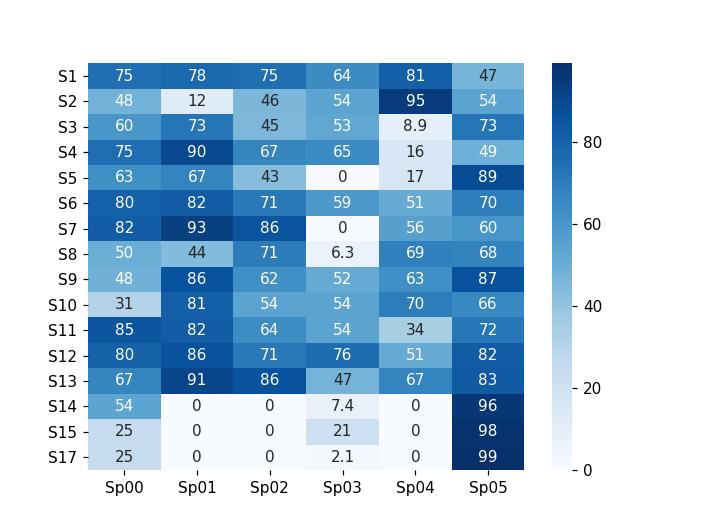

<AxesSubplot:>

In [89]:
df_l1_precision = pd.DataFrame(
    l1_precision_matrix, index=l1_sites,
    columns=['Sp{:02d}'.format(k) for k in l1_labels]
)
plt.figure()
sn.heatmap(df_l1_precision, annot=True, cmap='Blues')

df_l1_recall = pd.DataFrame(
    l1_recall_matrix, index=l1_sites,
    columns=['Sp{:02d}'.format(k) for k in l1_labels]
)
plt.figure()
sn.heatmap(df_l1_recall, annot=True, cmap='Blues')

In [96]:
confusion_matrix_l1_site = [np.zeros((len(l1_labels), len(l1_labels))) for i in range(0, len(l1_sites))]
for i, s in enumerate(l1_sites):
    gt = cv2.imread(os.path.join(path, '{:}GT.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    pred = cv2.imread(os.path.join(path, '{:}Result.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    roi = cv2.imread(os.path.join(path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100

    gt_vec = gt[roi]
    pred_vec = pred[roi]
       
    print(i, np.unique(gt_vec), np.unique(pred_vec))
    
    for lab_gt, lab_pred in zip(gt_vec, pred_vec):
        confusion_matrix_l1_site[i][lab_gt, lab_pred] += 1

0 [0 1 2 3 4 5] [0 1 2 3 4 5]
1 [0 1 2 3 4 5] [0 1 2 3 4 5]
2 [0 1 2 3 4 5] [0 1 2 3 4 5]
3 [0 1 2 3 4 5] [0 1 2 3 4 5]
4 [0 1 2 3 4 5] [0 1 2 3 4 5]
5 [0 1 2 3 4 5] [0 1 2 3 4 5]
6 [0 1 2 3 4 5] [0 1 2 3 4 5]
7 [0 1 2 3 4 5] [0 1 2 3 4 5]
8 [0 1 2 3 4 5] [0 1 2 3 4 5]
9 [0 1 2 3 4 5] [0 1 2 3 4 5]
10 [0 1 2 3 4 5] [0 1 2 3 4 5]
11 [0 1 2 3 4 5] [0 1 2 3 4 5]
12 [0 1 2 3 4 5] [0 1 2 3 4 5]
13 [0 3 4 5] [0 1 3 5]
14 [0 1 2 3 5] [0 1 2 3 4 5]
15 [0 3 5] [0 3 5]


<IPython.core.display.Javascript object>


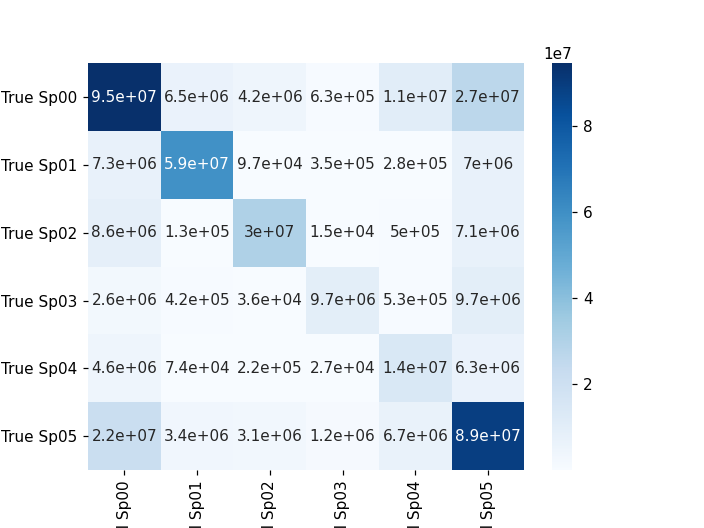

<IPython.core.display.Javascript object>


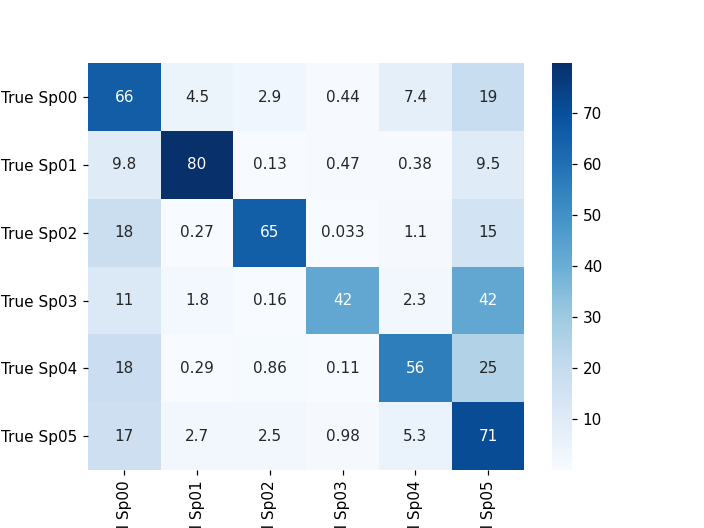

<AxesSubplot:>

In [98]:
confusion_matrix_l1 = np.zeros((len(l1_labels), len(l1_labels)))
for i, s in enumerate(l1_sites):
    roi = cv2.imread(os.path.join(path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    confusion_matrix_l1 += confusion_matrix_l1_site[i]
df_l1 = pd.DataFrame(
    confusion_matrix_l1, index = ['True Sp{:02d}'.format(k) for k in l1_labels],
    columns = ['Model Sp{:02d}'.format(k) for k in l1_labels]
)
plt.figure()
sn.heatmap(df_l1, annot=True, cmap='Blues')

confusion_matrix_l1 = np.zeros((len(l1_labels), len(l1_labels)))
for i, s in enumerate(l1_sites):
    roi = cv2.imread(os.path.join(path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    for lab, area_i in enumerate(areas_l1):
        confusion_matrix_l1[lab, :] += 100 * confusion_matrix_l1_site[i][lab, :] / area_i
df_l1 = pd.DataFrame(
    confusion_matrix_l1, index = ['True Sp{:02d}'.format(k) for k in l1_labels],
    columns = ['Model Sp{:02d}'.format(k) for k in l1_labels]
)
plt.figure()
sn.heatmap(df_l1, annot=True, cmap='Blues')

### Sarah level 1

In [139]:
sarah_path = './level1_Sarah'
all_path = './class11_all'
mix_path = './level1_all'

sarah_sites = ['S{:d}'.format(i) for i in range(1, 14)]
sarah_labels = []
for s in sarah_sites:
    gt = cv2.imread(os.path.join(sarah_path, '{:}GT.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    sarah_labels += [lab for lab in np.unique(gt).tolist() if lab not in sarah_labels]
    print(s, sorted(sarah_labels))
sarah_labels = sorted(sarah_labels)

S1 [0, 1, 2, 3, 4, 5]
S2 [0, 1, 2, 3, 4, 5]
S3 [0, 1, 2, 3, 4, 5]
S4 [0, 1, 2, 3, 4, 5]
S5 [0, 1, 2, 3, 4, 5]
S6 [0, 1, 2, 3, 4, 5]
S7 [0, 1, 2, 3, 4, 5]
S8 [0, 1, 2, 3, 4, 5]
S9 [0, 1, 2, 3, 4, 5]
S10 [0, 1, 2, 3, 4, 5]
S11 [0, 1, 2, 3, 4, 5]
S12 [0, 1, 2, 3, 4, 5]
S13 [0, 1, 2, 3, 4, 5]


In [140]:
areas_sarah = [0] * len(sarah_labels)
for s in sarah_sites:
    gt = cv2.imread(os.path.join(sarah_path, '{:}GT.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    roi = cv2.imread(os.path.join(sarah_path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    gt = gt[roi]
    for lab in sarah_labels:
        areas_sarah[lab] += np.sum(gt == lab)

for species, rate in zip(np.argsort(areas_sarah)[::-1],  np.sort(areas_sarah)[::-1]):
    print(species, 100 * rate / np.sum(areas_sarah))

0 33.715050026580684
5 26.44830117142382
1 17.549119949381147
2 11.082103416423774
4 5.900882727406325
3 5.304542708784252


In [141]:
relative_areas = np.zeros((len(sarah_sites), len(sarah_labels)))
for i, s in enumerate(sarah_sites):
    gt = cv2.imread(os.path.join(sarah_path, '{:}GT.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    roi = cv2.imread(os.path.join(sarah_path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    gt = gt[roi]
    for lab in sarah_labels:
        relative_areas[i][lab] = 100 * np.sum(gt == lab) / areas_sarah[lab]

In [142]:
mosaic_areas = np.zeros((len(sarah_sites) + 1, len(sarah_labels)))
for i, s in enumerate(sarah_sites):
    gt = cv2.imread(os.path.join(sarah_path, '{:}GT.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    roi = cv2.imread(os.path.join(sarah_path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    gt = gt[roi]
    for lab in sarah_labels:
        mosaic_areas[i][lab] = 100 * np.sum(gt == lab) / len(gt)
for lab in sarah_labels:
    mosaic_areas[-1][lab] = 100 * areas_sarah[lab] / np.sum(areas_sarah)

<IPython.core.display.Javascript object>


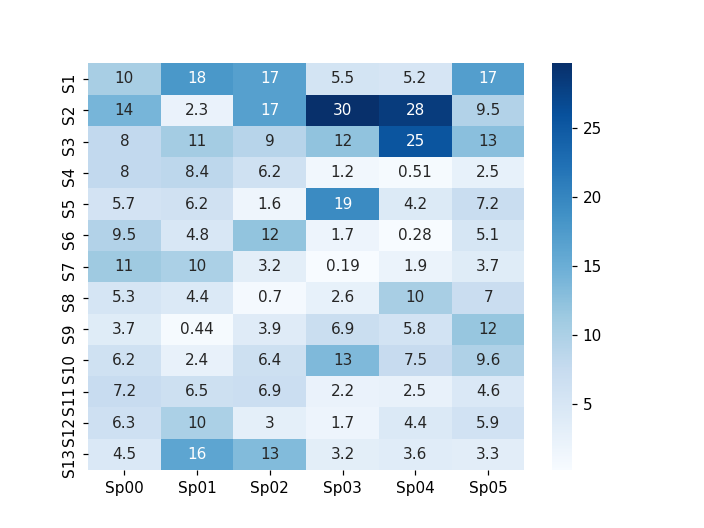

<AxesSubplot:>

In [143]:
df_relative = pd.DataFrame(
    relative_areas, index=sarah_sites,
    columns=['Sp{:02d}'.format(k) for k in sarah_labels]
)
plt.figure()
sn.heatmap(df_relative, annot=True, cmap='Blues')

<IPython.core.display.Javascript object>


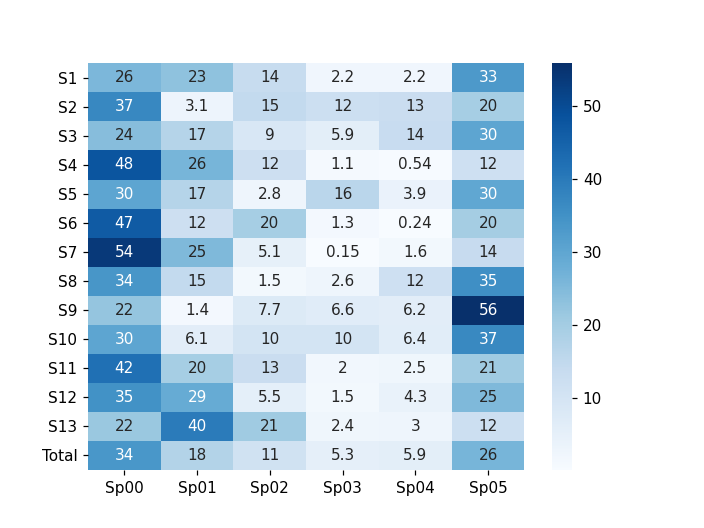

<AxesSubplot:>

In [144]:
df_mosaic = pd.DataFrame(
    mosaic_areas, index=sarah_sites  + ['Total'],
    columns = ['Sp{:02d}'.format(k) for k in sarah_labels]
)
plt.figure()
sn.heatmap(df_mosaic, annot=True, cmap='Blues')

In [145]:
label_mapping = [[0], [1], [3], [8], [9], [2, 4, 5, 6, 7, 10, 11]]

sarah_precision_matrix_l1 = np.zeros((len(sarah_sites), len(sarah_labels)))
sarah_recall_matrix_l1 = np.zeros((len(sarah_sites), len(sarah_labels)))
sarah_precision_matrix_all = np.zeros((len(sarah_sites), len(sarah_labels)))
sarah_recall_matrix_all = np.zeros((len(sarah_sites), len(sarah_labels)))
sarah_precision_matrix_mix = np.zeros((len(sarah_sites), len(sarah_labels)))
sarah_recall_matrix_mix = np.zeros((len(sarah_sites), len(sarah_labels)))
for i, s in enumerate(sarah_sites):
    gt = cv2.imread(os.path.join(sarah_path, '{:}GT.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    pred_l1 = cv2.imread(os.path.join(sarah_path, '{:}Result.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    pred_all = cv2.imread(os.path.join(all_path, '{:}Result.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    pred_mix = cv2.imread(os.path.join(mix_path, '{:}Result.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    new_pred_all = np.zeros_like(pred_all)
    for new_lab, old_lab in enumerate(label_mapping):
        new_pred_all[np.isin(pred_all, old_lab)] = new_lab
    roi = cv2.imread(os.path.join(sarah_path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100

    gt_vec = gt[roi]
    pred_l1_vec = pred_l1[roi]
    pred_mix_vec = pred_mix[roi]
    pred_all_vec = new_pred_all[roi]
    
    recalls_l1 = recall(pred_l1_vec, gt_vec)
    precisions_l1 = precision(pred_l1_vec, gt_vec)
    
    recalls_all = recall(pred_all_vec, gt_vec)
    precisions_all = precision(pred_all_vec, gt_vec)
    
    recalls_mix = recall(pred_mix_vec, gt_vec)
    precisions_mix = precision(pred_mix_vec, gt_vec)

    for (lab, r_l1_i), (_, p_l1_i), (_, r_all_i), (_, p_all_i), (_, r_mix_i), (_, p_mix_i) in zip(
        recalls_l1, precisions_l1, recalls_all, precisions_all, recalls_mix, precisions_mix
    ):
#         print(
#             'S{:d}'.format(i), 'Class', lab, recall_i, precision_i
#         )
        sarah_precision_matrix_l1[i][lab] = p_l1_i
        sarah_recall_matrix_l1[i][lab] = r_l1_i
        sarah_precision_matrix_all[i][lab] = p_all_i
        sarah_recall_matrix_all[i][lab] = r_all_i
        sarah_precision_matrix_mix[i][lab] = p_mix_i
        sarah_recall_matrix_mix[i][lab] = r_mix_i
        
    print(
        '{:} Accuracy'.format(s), accuracy(pred_l1_vec, gt_vec),
        accuracy(pred_mix_vec, gt_vec), accuracy(pred_all_vec, gt_vec)
    )

S1 Accuracy 70.12660570452938 66.26613383751655 65.36777081142206
S2 Accuracy 52.74318970898234 54.622116650646056 57.50995075277346
S3 Accuracy 53.86254695131136 57.25813179464076 51.525981661108965
S4 Accuracy 80.37101723515286 74.5969390233343 72.71887968338511
S5 Accuracy 62.37250349473718 58.74560801079287 49.476243526497996
S6 Accuracy 72.64028230546795 76.45852978840834 68.58859560116065
S7 Accuracy 79.80779639590622 81.50577092606865 78.91715552261603
S8 Accuracy 58.86016474221083 56.73614185305644 61.14279493731783
S9 Accuracy 69.2912497058727 72.48216519480219 55.68612356544332
S10 Accuracy 52.11721293710183 53.82852138211026 40.76977732575501
S11 Accuracy 73.49442465636204 76.91130129012106 72.68187308607781
S12 Accuracy 78.69159730704364 80.56607427963077 68.42292437185269
S13 Accuracy 81.78569039179716 82.16809437600271 82.36260137472219


<IPython.core.display.Javascript object>


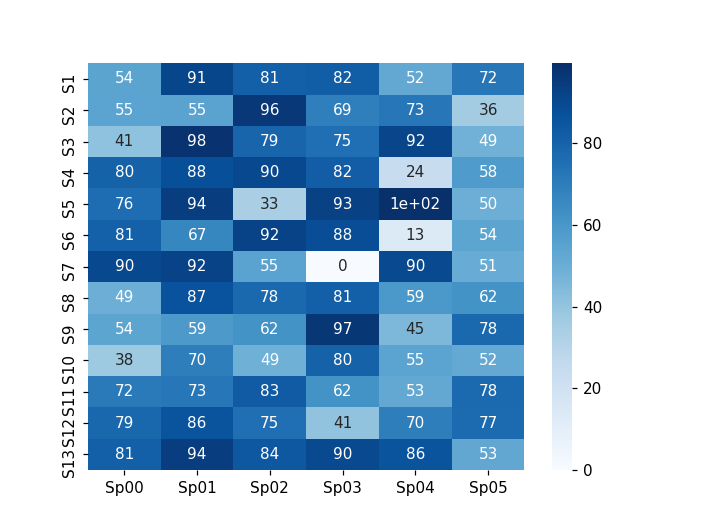

<IPython.core.display.Javascript object>


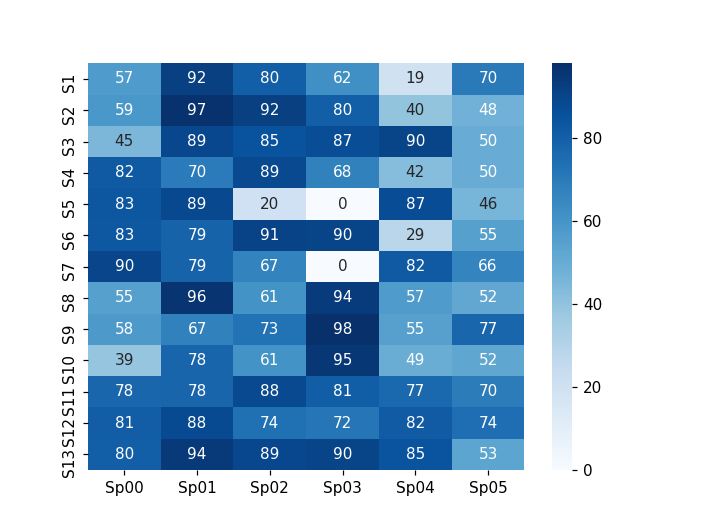

<IPython.core.display.Javascript object>


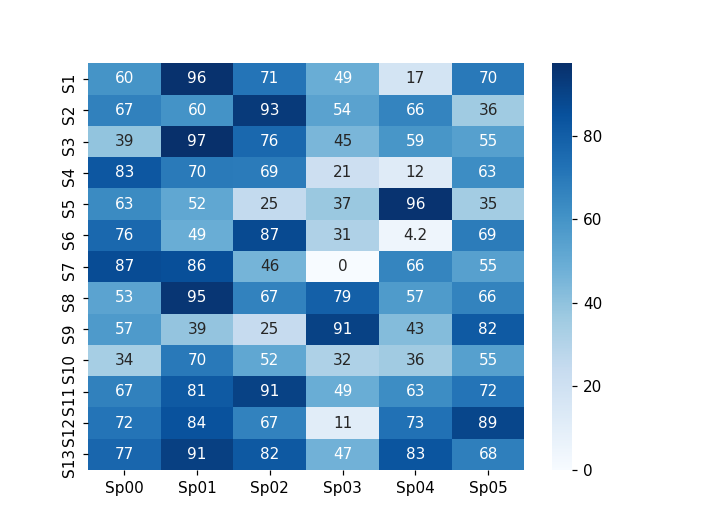

<AxesSubplot:>

In [146]:
df_sarah_precision_l1 = pd.DataFrame(
    sarah_precision_matrix_l1, index=sarah_sites,
    columns=['Sp{:02d}'.format(k) for k in sarah_labels]
)
plt.figure()
sn.heatmap(df_sarah_precision_l1, annot=True, cmap='Blues')

df_sarah_precision_mix = pd.DataFrame(
    sarah_precision_matrix_mix, index=sarah_sites,
    columns=['Sp{:02d}'.format(k) for k in sarah_labels]
)
plt.figure()
sn.heatmap(df_sarah_precision_mix, annot=True, cmap='Blues')

df_sarah_precision_all = pd.DataFrame(
    sarah_precision_matrix_all, index=sarah_sites,
    columns=['Sp{:02d}'.format(k) for k in sarah_labels]
)
plt.figure()
sn.heatmap(df_sarah_precision_all, annot=True, cmap='Blues')

<IPython.core.display.Javascript object>


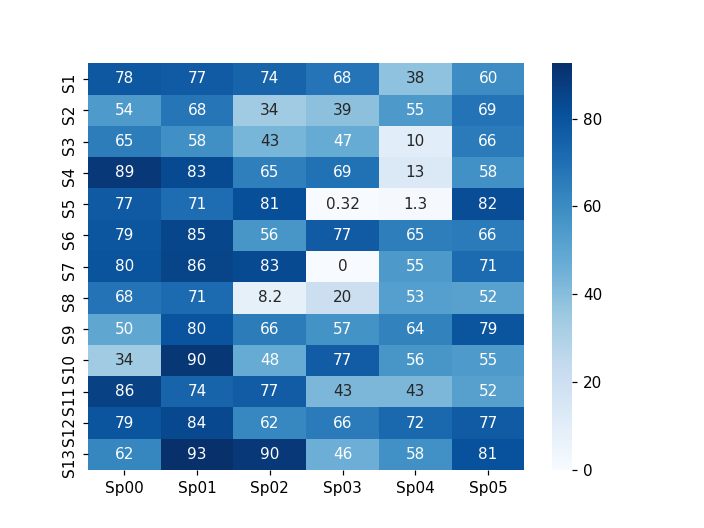

<IPython.core.display.Javascript object>


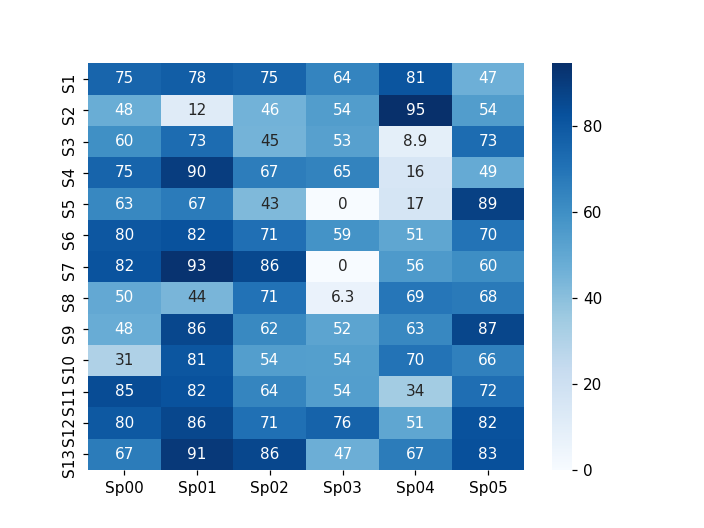

<IPython.core.display.Javascript object>


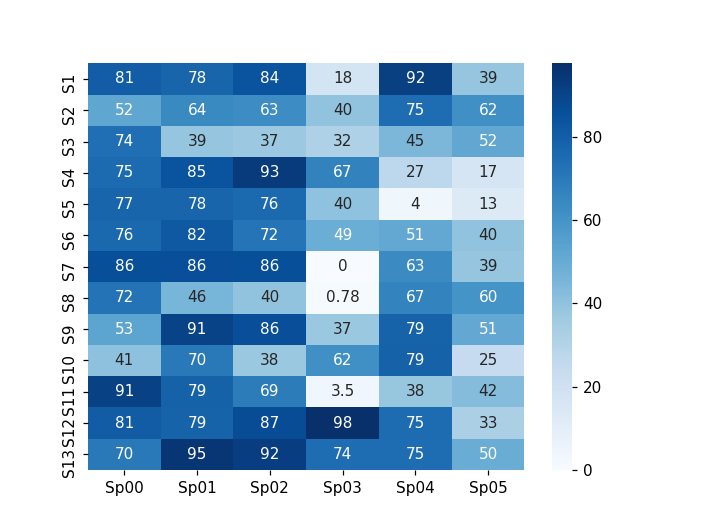

<AxesSubplot:>

In [147]:
df_sarah_recall_l1 = pd.DataFrame(
    sarah_recall_matrix_l1, index=sarah_sites,
    columns=['Sp{:02d}'.format(k) for k in sarah_labels]
)
plt.figure()
sn.heatmap(df_sarah_recall_l1, annot=True, cmap='Blues')

df_sarah_recall_mix = pd.DataFrame(
    sarah_recall_matrix_mix, index=sarah_sites,
    columns=['Sp{:02d}'.format(k) for k in sarah_labels]
)
plt.figure()
sn.heatmap(df_sarah_recall_mix, annot=True, cmap='Blues')

df_sarah_recall_all = pd.DataFrame(
    sarah_recall_matrix_all, index=sarah_sites,
    columns=['Sp{:02d}'.format(k) for k in sarah_labels]
)
plt.figure()
sn.heatmap(df_sarah_recall_all, annot=True, cmap='Blues')

In [148]:
cm_sarah_l1_site = [np.zeros((len(sarah_labels), len(sarah_labels))) for i in range(0, len(sarah_sites))]
cm_sarah_mix_site = [np.zeros((len(sarah_labels), len(sarah_labels))) for i in range(0, len(sarah_sites))]
cm_sarah_all_site = [np.zeros((len(sarah_labels), len(sarah_labels))) for i in range(0, len(sarah_sites))]
for i, s in enumerate(sarah_sites):
    gt = cv2.imread(os.path.join(sarah_path, '{:}GT.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    pred_l1 = cv2.imread(os.path.join(sarah_path, '{:}Result.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    pred_all = cv2.imread(os.path.join(all_path, '{:}Result.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    pred_mix = cv2.imread(os.path.join(mix_path, '{:}Result.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    new_pred_all = np.zeros_like(pred_all)
    for new_lab, old_lab in enumerate(label_mapping):
        new_pred_all[np.isin(pred_all, old_lab)] = new_lab
    roi = cv2.imread(os.path.join(sarah_path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100

    gt_vec = gt[roi]
    pred_l1_vec = pred_l1[roi]
    pred_mix_vec = pred_mix[roi]
    pred_all_vec = new_pred_all[roi]
       
    print(
        s, np.unique(gt_vec), np.unique(pred_l1_vec),
        np.unique(pred_mix_vec), np.unique(pred_all_vec)
    )
    
    for lab_gt, lab_pred in zip(gt_vec, pred_l1_vec):
        cm_sarah_l1_site[i][lab_gt, lab_pred] += 1
    for lab_gt, lab_pred in zip(gt_vec, pred_mix_vec):
        cm_sarah_mix_site[i][lab_gt, lab_pred] += 1
    for lab_gt, lab_pred in zip(gt_vec, pred_all_vec):
        cm_sarah_all_site[i][lab_gt, lab_pred] += 1

S1 [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5]
S2 [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5]
S3 [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5]
S4 [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5]
S5 [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5]
S6 [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5]
S7 [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5]
S8 [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5]
S9 [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5]
S10 [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5]
S11 [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5]
S12 [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5]
S13 [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5] [0 1 2 3 4 5]


<IPython.core.display.Javascript object>


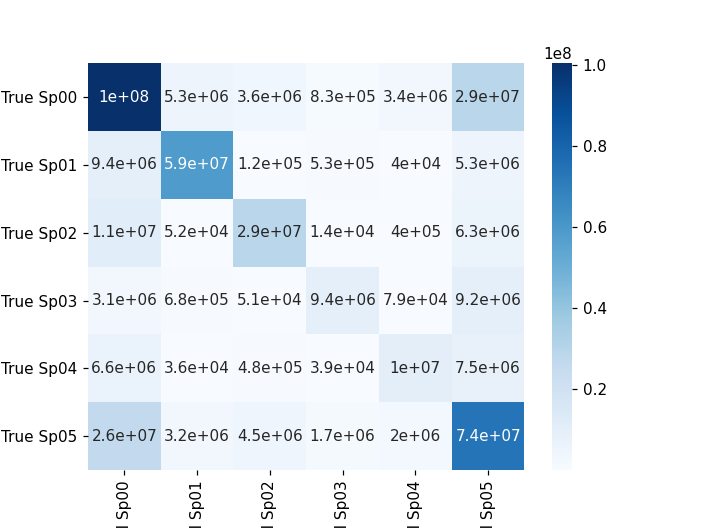

<IPython.core.display.Javascript object>


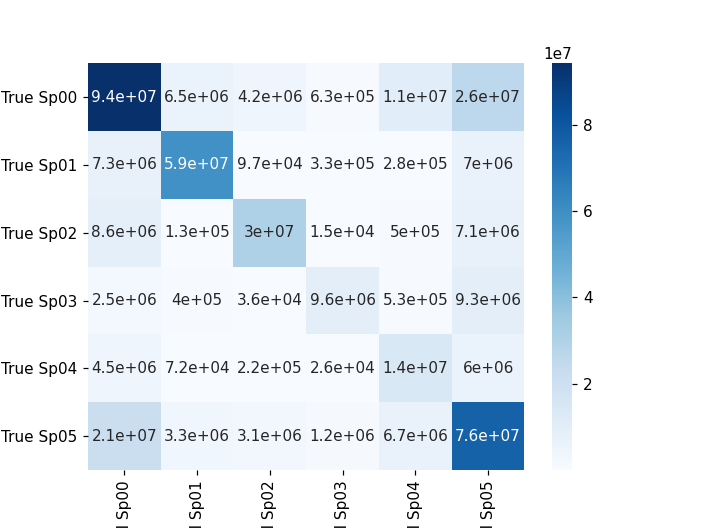

<IPython.core.display.Javascript object>


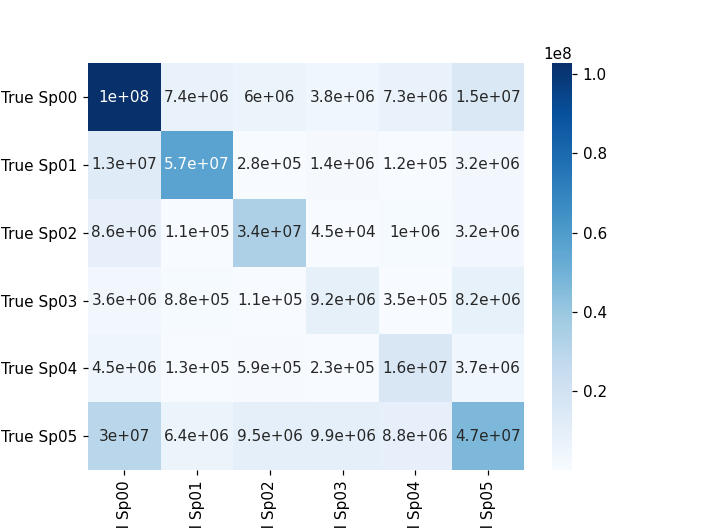

<AxesSubplot:>

In [149]:
cm_sarah_l1 = np.zeros((len(sarah_labels), len(sarah_labels)))
for i, s in enumerate(sarah_sites):
    roi = cv2.imread(os.path.join(path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    cm_sarah_l1 += cm_sarah_l1_site[i]
df_sarah_l1 = pd.DataFrame(
    cm_sarah_l1, index=['True Sp{:02d}'.format(k) for k in sarah_labels],
    columns=['Model Sp{:02d}'.format(k) for k in sarah_labels]
)
plt.figure()
sn.heatmap(df_sarah_l1, annot=True, cmap='Blues')

cm_sarah_mix = np.zeros((len(sarah_labels), len(sarah_labels)))
for i, s in enumerate(sarah_sites):
    roi = cv2.imread(os.path.join(path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    cm_sarah_mix += cm_sarah_mix_site[i]
df_sarah_mix = pd.DataFrame(
    cm_sarah_mix, index=['True Sp{:02d}'.format(k) for k in sarah_labels],
    columns=['Model Sp{:02d}'.format(k) for k in sarah_labels]
)
plt.figure()
sn.heatmap(df_sarah_mix, annot=True, cmap='Blues')

cm_sarah_all = np.zeros((len(sarah_labels), len(sarah_labels)))
for i, s in enumerate(sarah_sites):
    roi = cv2.imread(os.path.join(path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    cm_sarah_all += cm_sarah_all_site[i]
df_sarah_all = pd.DataFrame(
    cm_sarah_all, index=['True Sp{:02d}'.format(k) for k in sarah_labels],
    columns=['Model Sp{:02d}'.format(k) for k in sarah_labels]
)
plt.figure()
sn.heatmap(df_sarah_all, annot=True, cmap='Blues')

<IPython.core.display.Javascript object>


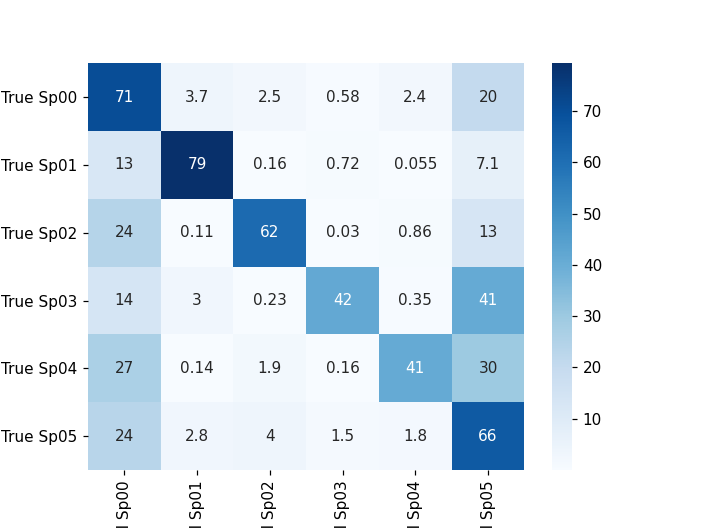

<IPython.core.display.Javascript object>


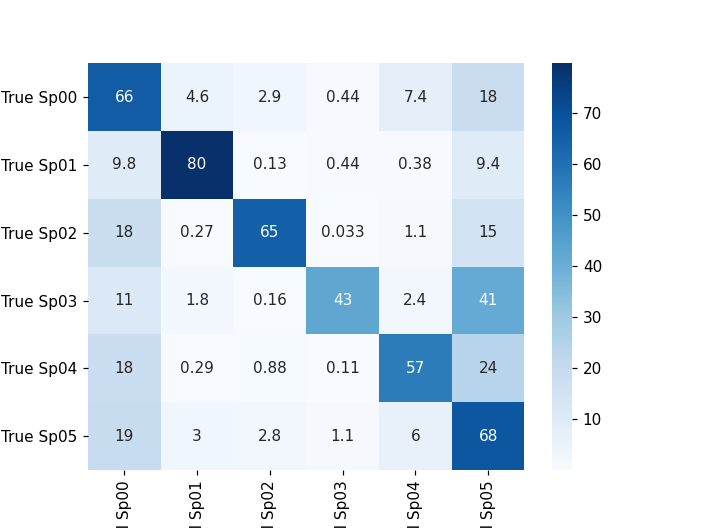

<IPython.core.display.Javascript object>


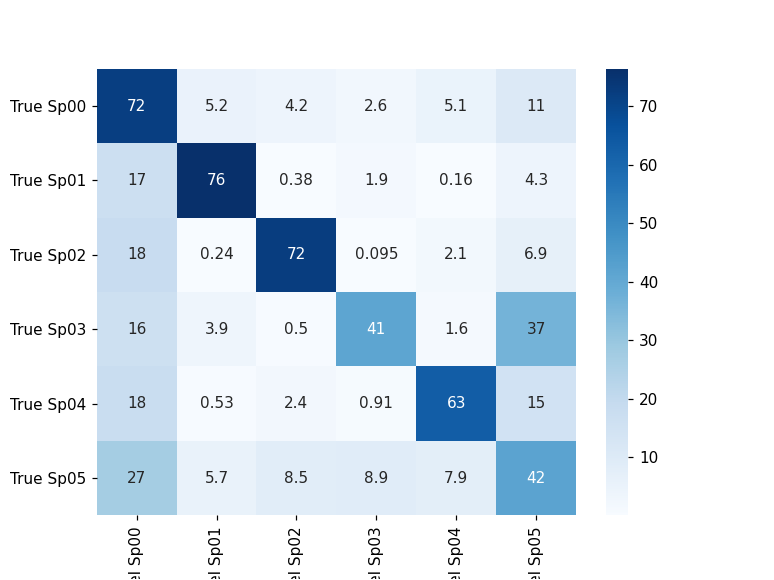

<AxesSubplot:>

In [150]:
cm_sarah_l1 = np.zeros((len(sarah_labels), len(sarah_labels)))
for i, s in enumerate(sarah_sites):
    roi = cv2.imread(os.path.join(path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    for lab, area_i in enumerate(areas_sarah):
        cm_sarah_l1[lab, :] += 100 * cm_sarah_l1_site[i][lab, :] / area_i
df_sarah_l1 = pd.DataFrame(
    cm_sarah_l1, index=['True Sp{:02d}'.format(k) for k in sarah_labels],
    columns=['Model Sp{:02d}'.format(k) for k in sarah_labels]
)
plt.figure()
sn.heatmap(df_sarah_l1, annot=True, cmap='Blues')

cm_sarah_mix = np.zeros((len(sarah_labels), len(sarah_labels)))
for i, s in enumerate(sarah_sites):
    roi = cv2.imread(os.path.join(path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    for lab, area_i in enumerate(areas_sarah):
        cm_sarah_mix[lab, :] += 100 * cm_sarah_mix_site[i][lab, :] / area_i
df_sarah_mix = pd.DataFrame(
    cm_sarah_mix, index=['True Sp{:02d}'.format(k) for k in sarah_labels],
    columns=['Model Sp{:02d}'.format(k) for k in sarah_labels]
)
plt.figure()
sn.heatmap(df_sarah_mix, annot=True, cmap='Blues')

cm_sarah_all = np.zeros((len(sarah_labels), len(sarah_labels)))
for i, s in enumerate(sarah_sites):
    roi = cv2.imread(os.path.join(path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    for lab, area_i in enumerate(areas_sarah):
        cm_sarah_all[lab, :] += 100 * cm_sarah_all_site[i][lab, :] / area_i
df_sarah_all = pd.DataFrame(
    cm_sarah_all, index=['True Sp{:02d}'.format(k) for k in sarah_labels],
    columns=['Model Sp{:02d}'.format(k) for k in sarah_labels]
)
plt.figure()
sn.heatmap(df_sarah_all, annot=True, cmap='Blues')

### Luca level 1

In [159]:
luca_path = './level1_Luca'
all_path = './all'
mix_path = './level1_all'

luca_sites = ['S14', 'S15', 'S17']
luca_labels = []
for s in luca_sites:
    gt = cv2.imread(os.path.join(luca_path, '{:}GT.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    luca_labels += [lab for lab in np.unique(gt).tolist() if lab not in luca_labels]
    print(s, sorted(luca_labels))
luca_labels = sorted(luca_labels)

S14 [0, 3, 4, 5]
S15 [0, 1, 2, 3, 4, 5]
S17 [0, 1, 2, 3, 4, 5]


In [160]:
areas_luca = [0] * len(luca_labels)
for s in luca_sites:
    gt = cv2.imread(os.path.join(luca_path, '{:}GT.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    roi = cv2.imread(os.path.join(luca_path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    gt = gt[roi]
    for lab in luca_labels:
        areas_luca[lab] += np.sum(gt == lab)

for species, rate in zip(np.argsort(areas_luca)[::-1],  np.sort(areas_luca)[::-1]):
    print(species, 100 * rate / np.sum(areas_luca))

5 86.92706159640446
0 6.476546633363313
3 3.2436646036008723
4 2.7528608705469555
1 0.5686729442388708
2 0.031193351845532652


In [161]:
relative_areas = np.zeros((len(luca_sites), len(luca_labels)))
for i, s in enumerate(luca_sites):
    gt = cv2.imread(os.path.join(luca_path, '{:}GT.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    roi = cv2.imread(os.path.join(luca_path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    gt = gt[roi]
    for lab in luca_labels:
        relative_areas[i][lab] = 100 * np.sum(gt == lab) / areas_luca[lab]

In [162]:
mosaic_areas = np.zeros((len(luca_sites) + 1, len(luca_labels)))
for i, s in enumerate(luca_sites):
    gt = cv2.imread(os.path.join(luca_path, '{:}GT.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    roi = cv2.imread(os.path.join(luca_path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    gt = gt[roi]
    for lab in luca_labels:
        mosaic_areas[i][lab] = 100 * np.sum(gt == lab) / len(gt)
for lab in luca_labels:
    mosaic_areas[-1][lab] = 100 * areas_luca[lab] / np.sum(areas_luca)

<IPython.core.display.Javascript object>


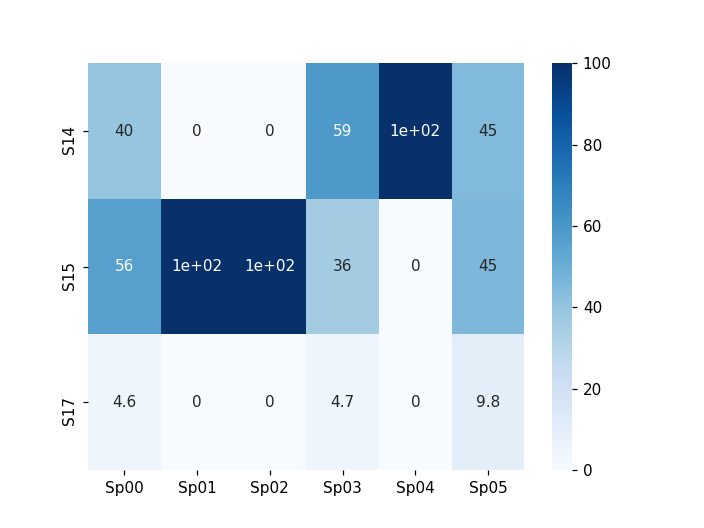

<AxesSubplot:>

In [163]:
df_relative = pd.DataFrame(
    relative_areas, index=luca_sites,
    columns=['Sp{:02d}'.format(k) for k in luca_labels]
)
plt.figure()
sn.heatmap(df_relative, annot=True, cmap='Blues')

<IPython.core.display.Javascript object>


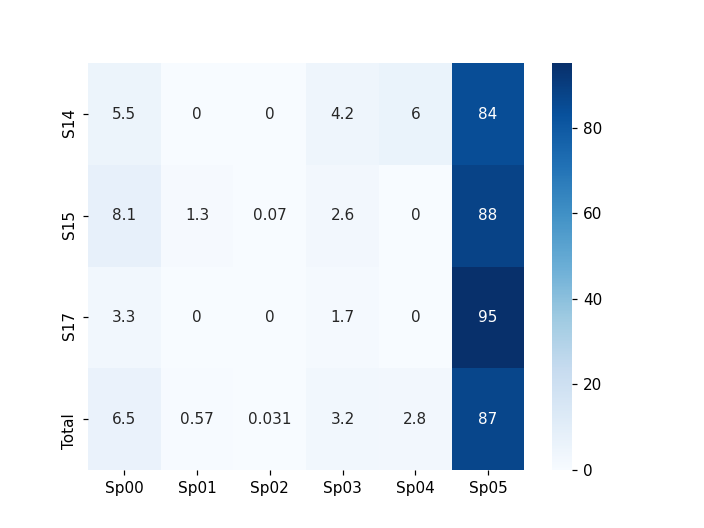

<AxesSubplot:>

In [164]:
df_mosaic = pd.DataFrame(
    mosaic_areas, index=luca_sites  + ['Total'],
    columns = ['Sp{:02d}'.format(k) for k in luca_labels]
)
plt.figure()
sn.heatmap(df_mosaic, annot=True, cmap='Blues')

In [168]:
label_mapping = [[0], [1], [3], [8], [9], [2, 4, 5, 6, 7, 10, 11]]

luca_precision_matrix_l1 = np.zeros((len(luca_sites), len(luca_labels)))
luca_recall_matrix_l1 = np.zeros((len(luca_sites), len(luca_labels)))
luca_precision_matrix_all = np.zeros((len(luca_sites), len(luca_labels)))
luca_recall_matrix_all = np.zeros((len(luca_sites), len(luca_labels)))
luca_precision_matrix_mix = np.zeros((len(luca_sites), len(luca_labels)))
luca_recall_matrix_mix = np.zeros((len(luca_sites), len(luca_labels)))
for i, s in enumerate(luca_sites):
    gt = cv2.imread(os.path.join(luca_path, '{:}GT.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    pred_l1 = cv2.imread(os.path.join(luca_path, '{:}Result.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    pred_all = cv2.imread(os.path.join(all_path, '{:}Result.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    pred_mix = cv2.imread(os.path.join(mix_path, '{:}Result.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    new_pred_all = np.zeros_like(pred_all)
    for new_lab, old_lab in enumerate(label_mapping):
        new_pred_all[np.isin(pred_all, old_lab)] = new_lab
    roi = cv2.imread(os.path.join(luca_path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100

    gt_vec = gt[roi]
    pred_l1_vec = pred_l1[roi]
    pred_mix_vec = pred_mix[roi]
    pred_all_vec = new_pred_all[roi]
    
    recalls_l1 = recall(pred_l1_vec, gt_vec)
    precisions_l1 = precision(pred_l1_vec, gt_vec)
    
    recalls_all = recall(pred_all_vec, gt_vec)
    precisions_all = precision(pred_all_vec, gt_vec)
    
    recalls_mix = recall(pred_mix_vec, gt_vec)
    precisions_mix = precision(pred_mix_vec, gt_vec)

    for (lab, r_l1_i), (_, p_l1_i), (_, r_all_i), (_, p_all_i), (_, r_mix_i), (_, p_mix_i) in zip(
        recalls_l1, precisions_l1, recalls_all, precisions_all, recalls_mix, precisions_mix
    ):
#         print(
#             'S{:d}'.format(i), 'Class', lab, recall_i, precision_i
#         )
        luca_precision_matrix_l1[i][lab] = p_l1_i
        luca_recall_matrix_l1[i][lab] = r_l1_i
        luca_precision_matrix_all[i][lab] = p_all_i
        luca_recall_matrix_all[i][lab] = r_all_i
        luca_precision_matrix_mix[i][lab] = p_mix_i
        luca_recall_matrix_mix[i][lab] = r_mix_i
        
    print(
        '{:} Accuracy'.format(s), accuracy(pred_l1_vec, gt_vec),
        accuracy(pred_mix_vec, gt_vec), accuracy(pred_all_vec, gt_vec)
    )

S14 Accuracy 84.40447153326224 84.40335828162326 83.0898038107016
S15 Accuracy 87.22658714706944 88.94469021260309 88.31069841359195
S17 Accuracy 89.03021955193884 95.10208622930918 72.91972108495754


<IPython.core.display.Javascript object>


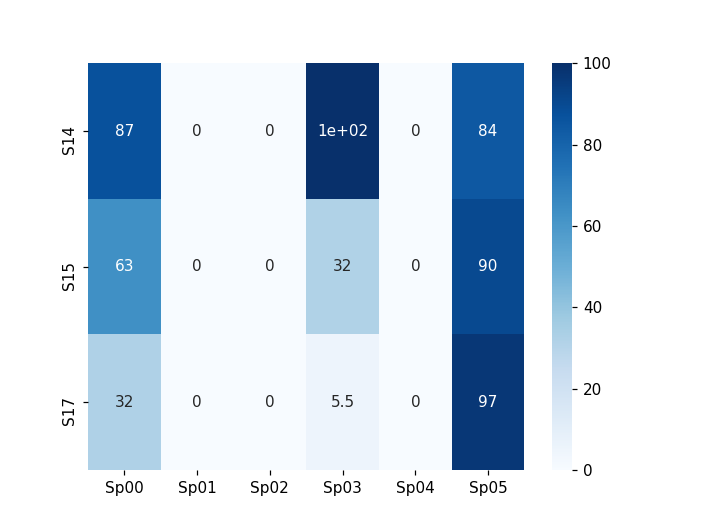

<IPython.core.display.Javascript object>


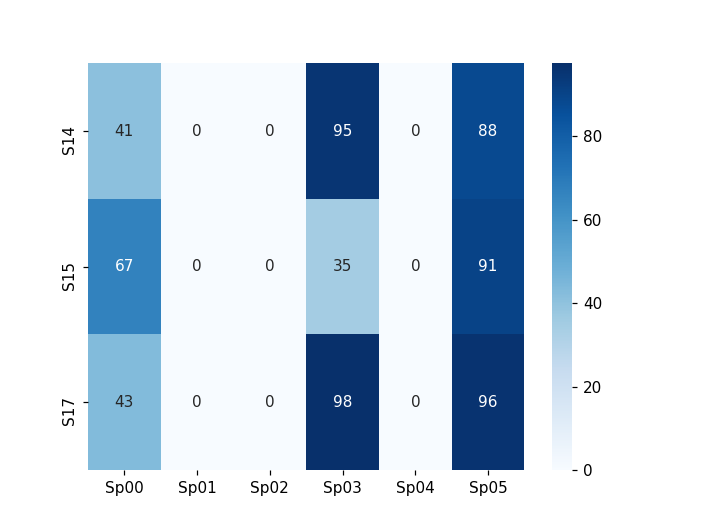

<IPython.core.display.Javascript object>


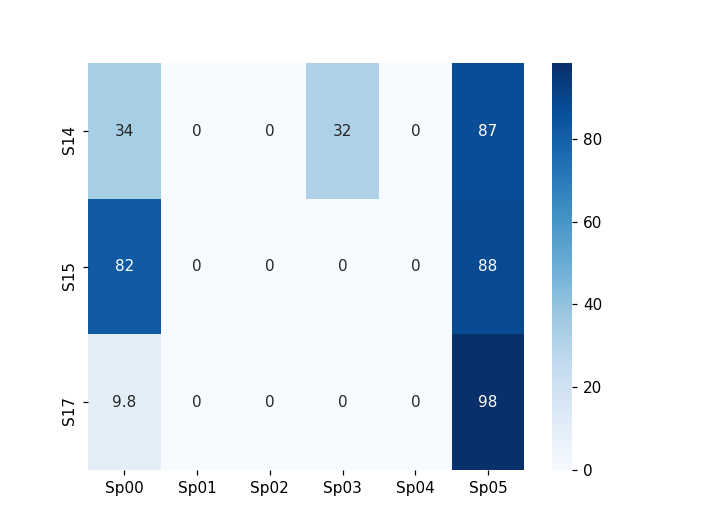

<AxesSubplot:>

In [169]:
df_luca_precision_l1 = pd.DataFrame(
    luca_precision_matrix_l1, index=luca_sites,
    columns=['Sp{:02d}'.format(k) for k in luca_labels]
)
plt.figure()
sn.heatmap(df_luca_precision_l1, annot=True, cmap='Blues')

df_luca_precision_mix = pd.DataFrame(
    luca_precision_matrix_mix, index=luca_sites,
    columns=['Sp{:02d}'.format(k) for k in luca_labels]
)
plt.figure()
sn.heatmap(df_luca_precision_mix, annot=True, cmap='Blues')

df_luca_precision_all = pd.DataFrame(
    luca_precision_matrix_all, index=luca_sites,
    columns=['Sp{:02d}'.format(k) for k in luca_labels]
)
plt.figure()
sn.heatmap(df_luca_precision_all, annot=True, cmap='Blues')

<IPython.core.display.Javascript object>


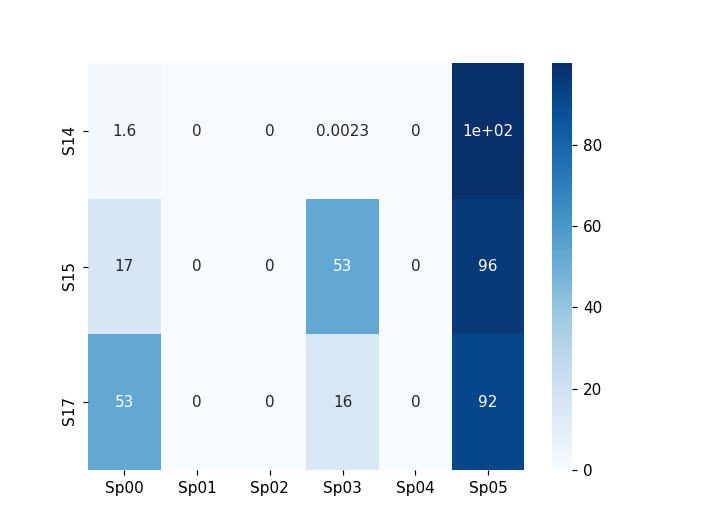

<IPython.core.display.Javascript object>


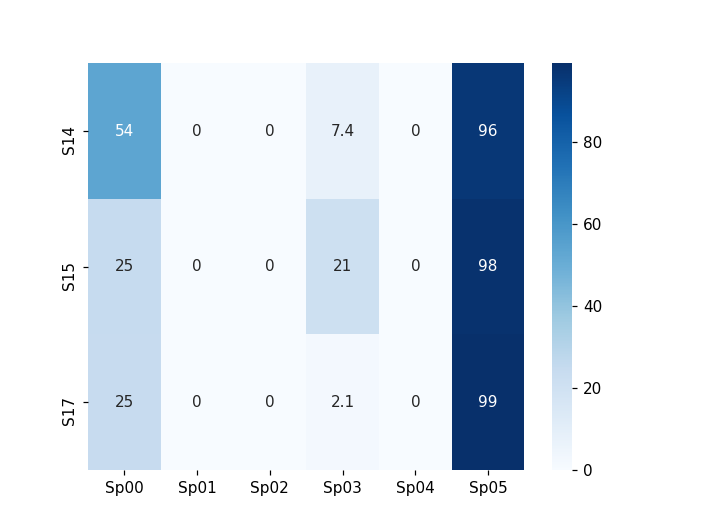

<IPython.core.display.Javascript object>


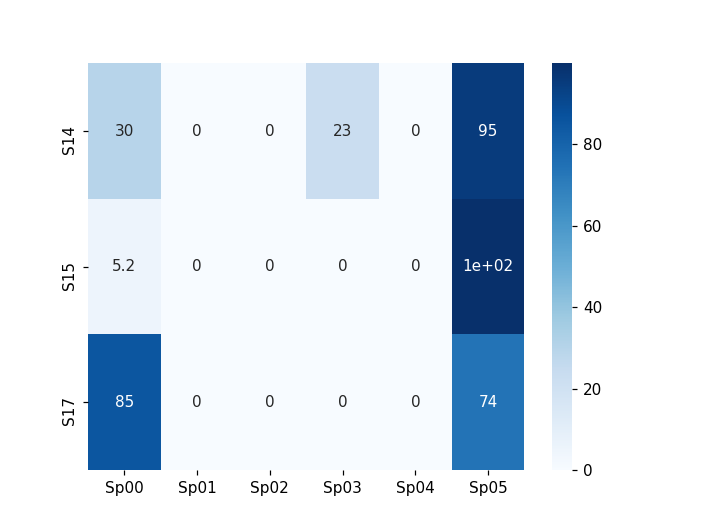

<AxesSubplot:>

In [170]:
df_luca_recall_l1 = pd.DataFrame(
    luca_recall_matrix_l1, index=luca_sites,
    columns=['Sp{:02d}'.format(k) for k in luca_labels]
)
plt.figure()
sn.heatmap(df_luca_recall_l1, annot=True, cmap='Blues')

df_luca_recall_mix = pd.DataFrame(
    luca_recall_matrix_mix, index=luca_sites,
    columns=['Sp{:02d}'.format(k) for k in luca_labels]
)
plt.figure()
sn.heatmap(df_luca_recall_mix, annot=True, cmap='Blues')

df_luca_recall_all = pd.DataFrame(
    luca_recall_matrix_all, index=luca_sites,
    columns=['Sp{:02d}'.format(k) for k in luca_labels]
)
plt.figure()
sn.heatmap(df_luca_recall_all, annot=True, cmap='Blues')

In [171]:
cm_luca_l1_site = [np.zeros((len(luca_labels), len(luca_labels))) for i in range(0, len(luca_sites))]
cm_luca_mix_site = [np.zeros((len(luca_labels), len(luca_labels))) for i in range(0, len(luca_sites))]
cm_luca_all_site = [np.zeros((len(luca_labels), len(luca_labels))) for i in range(0, len(luca_sites))]
for i, s in enumerate(luca_sites):
    gt = cv2.imread(os.path.join(luca_path, '{:}GT.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    pred_l1 = cv2.imread(os.path.join(luca_path, '{:}Result.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    pred_all = cv2.imread(os.path.join(all_path, '{:}Result.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    pred_mix = cv2.imread(os.path.join(mix_path, '{:}Result.png'.format(s)), cv2.IMREAD_GRAYSCALE)
    new_pred_all = np.zeros_like(pred_all)
    for new_lab, old_lab in enumerate(label_mapping):
        new_pred_all[np.isin(pred_all, old_lab)] = new_lab
    roi = cv2.imread(os.path.join(luca_path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100

    gt_vec = gt[roi]
    pred_l1_vec = pred_l1[roi]
    pred_mix_vec = pred_mix[roi]
    pred_all_vec = new_pred_all[roi]
       
    print(
        s, np.unique(gt_vec), np.unique(pred_l1_vec),
        np.unique(pred_mix_vec), np.unique(pred_all_vec)
    )
    
    for lab_gt, lab_pred in zip(gt_vec, pred_l1_vec):
        cm_luca_l1_site[i][lab_gt, lab_pred] += 1
    for lab_gt, lab_pred in zip(gt_vec, pred_mix_vec):
        cm_luca_mix_site[i][lab_gt, lab_pred] += 1
    for lab_gt, lab_pred in zip(gt_vec, pred_all_vec):
        cm_luca_all_site[i][lab_gt, lab_pred] += 1

S14 [0 3 4 5] [0 3 5] [0 1 3 5] [0 1 2 3 5]
S15 [0 1 2 3 5] [0 3 5] [0 1 2 3 4 5] [0 2 5]
S17 [0 3 5] [0 3 5] [0 3 5] [0 2 5]


<IPython.core.display.Javascript object>


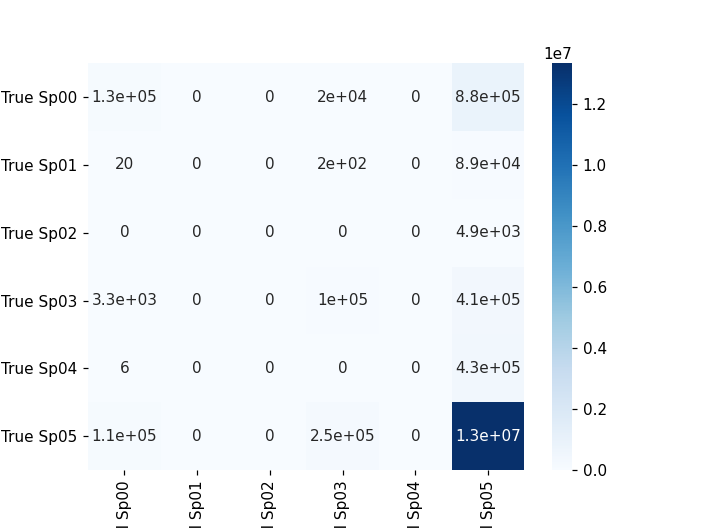

<IPython.core.display.Javascript object>


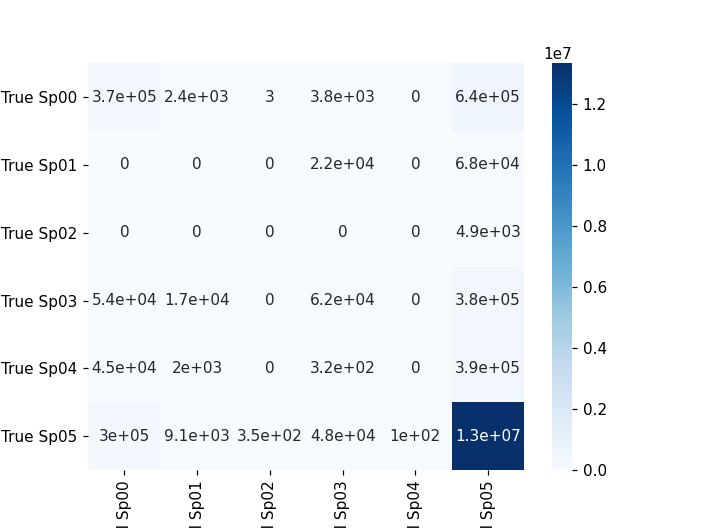

<IPython.core.display.Javascript object>


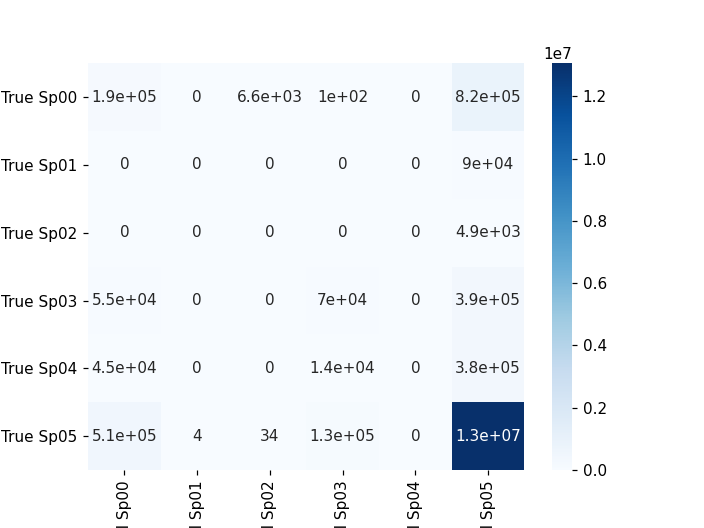

<AxesSubplot:>

In [178]:
cm_luca_l1 = np.zeros((len(luca_labels), len(luca_labels)))
for i, s in enumerate(luca_sites):
    roi = cv2.imread(os.path.join(luca_path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    cm_luca_l1 += cm_luca_l1_site[i]
df_luca_l1 = pd.DataFrame(
    cm_luca_l1, index=['True Sp{:02d}'.format(k) for k in luca_labels],
    columns=['Model Sp{:02d}'.format(k) for k in luca_labels]
)
plt.figure()
sn.heatmap(df_luca_l1, annot=True, cmap='Blues')

cm_luca_mix = np.zeros((len(luca_labels), len(luca_labels)))
for i, s in enumerate(luca_sites):
    roi = cv2.imread(os.path.join(luca_path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    cm_luca_mix += cm_luca_mix_site[i]
df_luca_mix = pd.DataFrame(
    cm_luca_mix, index=['True Sp{:02d}'.format(k) for k in luca_labels],
    columns=['Model Sp{:02d}'.format(k) for k in luca_labels]
)
plt.figure()
sn.heatmap(df_luca_mix, annot=True, cmap='Blues')

cm_luca_all = np.zeros((len(luca_labels), len(luca_labels)))
for i, s in enumerate(luca_sites):
    roi = cv2.imread(os.path.join(luca_path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    cm_luca_all += cm_luca_all_site[i]
df_luca_all = pd.DataFrame(
    cm_luca_all, index=['True Sp{:02d}'.format(k) for k in luca_labels],
    columns=['Model Sp{:02d}'.format(k) for k in luca_labels]
)
plt.figure()
sn.heatmap(df_luca_all, annot=True, cmap='Blues')

<IPython.core.display.Javascript object>


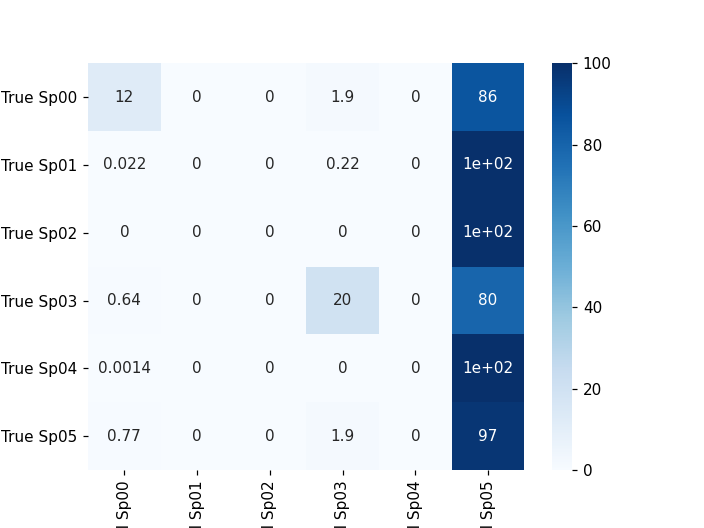

<IPython.core.display.Javascript object>


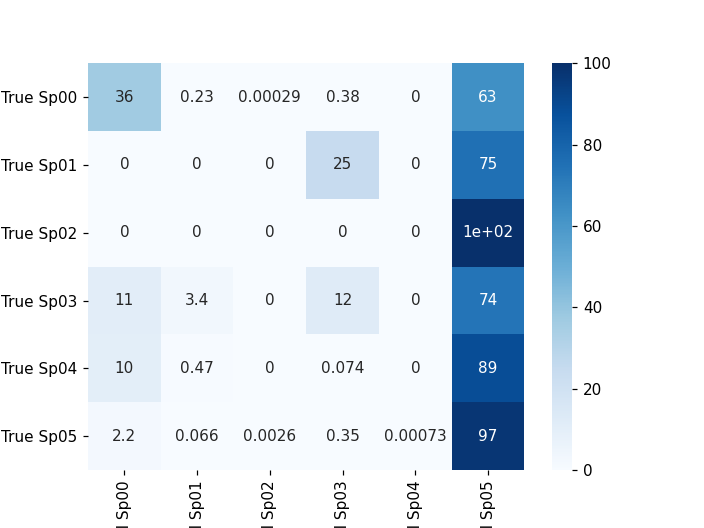

<IPython.core.display.Javascript object>


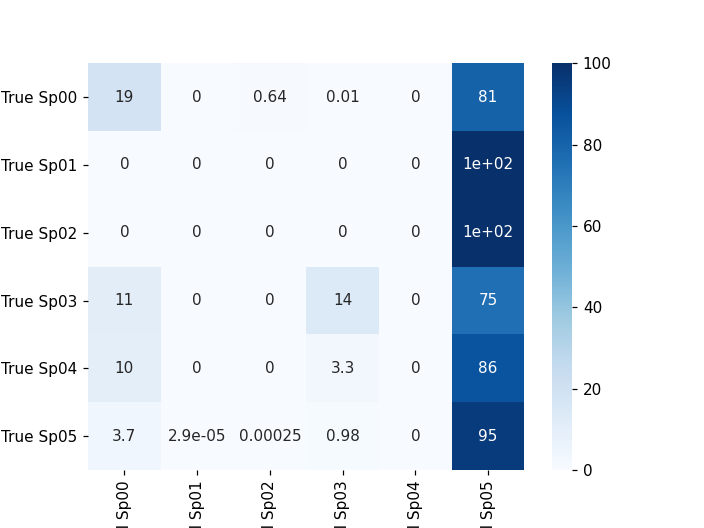

<AxesSubplot:>

In [179]:
cm_luca_l1 = np.zeros((len(luca_labels), len(luca_labels)))
for i, s in enumerate(luca_sites):
    roi = cv2.imread(os.path.join(luca_path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    for lab, area_i in enumerate(areas_luca):
        cm_luca_l1[lab, :] += 100 * cm_luca_l1_site[i][lab, :] / area_i
df_luca_l1 = pd.DataFrame(
    cm_luca_l1, index=['True Sp{:02d}'.format(k) for k in luca_labels],
    columns=['Model Sp{:02d}'.format(k) for k in luca_labels]
)
plt.figure()
sn.heatmap(df_luca_l1, annot=True, cmap='Blues')

cm_luca_mix = np.zeros((len(luca_labels), len(luca_labels)))
for i, s in enumerate(luca_sites):
    roi = cv2.imread(os.path.join(luca_path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    for lab, area_i in enumerate(areas_luca):
        cm_luca_mix[lab, :] += 100 * cm_luca_mix_site[i][lab, :] / area_i
df_luca_mix = pd.DataFrame(
    cm_luca_mix, index=['True Sp{:02d}'.format(k) for k in luca_labels],
    columns=['Model Sp{:02d}'.format(k) for k in luca_labels]
)
plt.figure()
sn.heatmap(df_luca_mix, annot=True, cmap='Blues')

cm_luca_all = np.zeros((len(luca_labels), len(luca_labels)))
for i, s in enumerate(luca_sites):
    roi = cv2.imread(os.path.join(luca_path, '{:}ROI.png'.format(s)), cv2.IMREAD_GRAYSCALE) < 100
    for lab, area_i in enumerate(areas_luca):
        cm_luca_all[lab, :] += 100 * cm_luca_all_site[i][lab, :] / area_i
df_luca_all = pd.DataFrame(
    cm_luca_all, index=['True Sp{:02d}'.format(k) for k in luca_labels],
    columns=['Model Sp{:02d}'.format(k) for k in luca_labels]
)
plt.figure()
sn.heatmap(df_luca_all, annot=True, cmap='Blues')